<a href="https://colab.research.google.com/github/anibahs/DSEM_INFO6105/blob/main/Crash_Course_in_Statistical_Learning_Classification_with_Logistic_Regression%2C_Decision_tree%2C_AutoML_Worked_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Crash Course in Statistical Learning - Binary classification using Linear, Tree and Ensemble Models - Worked Example


# **Abstract**


Predicting weather is something we all depend on in our daily lives. While predicting natual calamities can save lives, a simple task like predicting occurenc of rain in the next day can help a little bit for all of us.  

The dataset "Rain in Australia" can help us train our model to the same, where the target variable "RainTomorrow" represents the risk of rain in terms of "Yes" or "No".  
  \
  \
# **Dataset**


The dataset includes observations of the climate in Australia of a period of 10 years and how the rainfall varies depending on other climate changes.

* Target Variable: 
  * RainTomorrow : The amount of next day rain in mm. Used to create response variable RainTomorrow. A kind of measure of the "risk".
* Independant Variables:
  * Date : date of observation
  * Location : region within Australia
  * MinTemp : Minimum temperature in teh day in degree Celsius
  * MaxTemp : Maximum temperature in teh day in degree Celsius
  * Rainfall : The amount of rainfall recorded for the day in mm
  * Evaporation : The so-called Class A pan evaporation (mm) in the 24 hours to 9am
  * Sunshine : The number of hours of bright sunshine in the day.
  * WindGustDir : The direction of the strongest wind gust in the 24 hours to midnight
  * WindGustSpeed : The speed (km/h) of the strongest wind gust in the 24 hours to midnight
  * WinDir9am : Direction of the wind at 9am
  * WinDir3pm : Direction of the wind at 3pm
  * WindSpeed9am : Wind speed (km/hr) averaged over 10 minutes prior to 9am
  * WindSpeed3pm : Wind speed (km/hr) averaged over 10 minutes prior to 3pm
  * Humidity9am : Humidity (percent) at 9am
  * Humidity3pm : Humidity (percent) at 3pm
  * Pressure9am : Atmospheric pressure (hpa) reduced to mean sea level at 9am
  * Pressure3pm : Atmospheric pressure (hpa) reduced to mean sea level at 3pm
  * Cloud9am : Fraction of sky obscured by cloud at 9am. This is measured in "oktas", which are a unit of eigths. It records how many
  * Cloud3pm : Fraction of sky obscured by cloud at 3pm. This is measured in "oktas", which are a unit of eigths. It records how many
  * Temp9am : Temperature (degrees C) at 3pm
  * Temp3pm : Temperature (degrees C) at 9am
  * RainToday : Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0



[Dataset on Kaggle](https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package)

# Imports

In [119]:
#handle data using data frames
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skew
from collections import Counter

# To calculate the score
from sklearn.metrics import accuracy_score 
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE # Recursive Feature Selection
from sklearn.metrics import confusion_matrix

import random, math
from sklearn.metrics import r2_score, mean_squared_error 

from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.tree import DecisionTreeClassifier

# Feature Importance using Filter Method (Chi-Square)
from sklearn.feature_selection import SelectKBest, chi2

! pip install shap
! pip install eli5
! pip install -q kaggle
! pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o
! pip install lime
from lime import lime_tabular
import shap
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from sklearn.inspection import PartialDependenceDisplay
from sklearn.metrics import accuracy_score
from sklearn import metrics

import random, os, sys
import psutil
import logging

min_mem_size=6 
run_time=240
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))

port_no=random.randint(5555,55555)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import os

os.environ['KAGGLE_USERNAME'] = 'shabinasingh'
os.environ['KAGGLE_KEY'] = '4a64d2f32a2dec68f1b905c88bb66932'

In [3]:
!mkdir ~/.kaggle
!kaggle datasets download -d jsphyg/weather-dataset-rattle-package
!unzip -o weather-dataset-rattle-package.zip -d /content

  0% 0.00/3.83M [00:00<?, ?B/s]
100% 3.83M/3.83M [00:00<00:00, 159MB/s]
Archive:  weather-dataset-rattle-package.zip
  inflating: /content/weatherAUS.csv  


In [4]:
csv = '/content/weatherAUS.csv'
df = pd.read_csv(csv)
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


# Data cleaning

In this section, we will discuss data preprocessing, which is a critical step in the development of machine learning and AI models. The primary objective of data preprocessing is to transform the raw data into a format that is more easily and effectively processed by the data science algorithms.

Data preprocessing techniques are generally used at the earliest stages of the machine learning and AI development pipeline to ensure that the final results are accurate, reliable, and effective. This process involves several tools and methods that are designed to handle different types of data and address different types of issues that might arise during the data analysis process.

Some of the most commonly used techniques for data preprocessing include sampling, transformation, denoising, imputation, normalization, and feature extraction.

Sampling techniques are used to select a representative subset of data from a large population to reduce the computational complexity and improve the efficiency of the analysis.

Transformation techniques involve manipulating raw data to create a single input, such as scaling, normalization, or encoding categorical data.

Denoising techniques remove unwanted noise from the data that can lead to inaccurate results.

Imputation techniques are used to fill in missing values in the data using statistical methods.

Normalization techniques are used to organize data for more efficient access and processing.

Feature extraction techniques help to identify and extract relevant features from the data that are significant in a particular context.

Overall, data preprocessing is an essential step in the data science pipeline, and mastering the different techniques involved is crucial for developing accurate and effective machine learning and AI models.

## Looking at data types, differenting categorical and numerical features

In [ ]:
categorical_columns = df.select_dtypes(include=['object']).columns
df[categorical_columns].describe()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,145460,145460,135134,134894,141232,142199,142193
unique,3436,49,16,16,16,2,2
top,2013-11-12,Canberra,W,N,SE,No,No
freq,49,3436,9915,11758,10838,110319,110316


In [ ]:
numerical_columns = df.select_dtypes(include=['int','float','float64']).columns
df[numerical_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


## Looking at null/missing values

In [ ]:
df.isnull().sum().sort_values(ascending=False)

Sunshine         69835
Evaporation      62790
Cloud3pm         59358
Cloud9am         55888
Pressure9am      15065
Pressure3pm      15028
WindDir9am       10566
WindGustDir      10326
WindGustSpeed    10263
Humidity3pm       4507
WindDir3pm        4228
Temp3pm           3609
RainTomorrow      3267
Rainfall          3261
RainToday         3261
WindSpeed3pm      3062
Humidity9am       2654
Temp9am           1767
WindSpeed9am      1767
MinTemp           1485
MaxTemp           1261
Location             0
Date                 0
dtype: int64

In [ ]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Sunshine,69835,0.480098
Evaporation,62790,0.431665
Cloud3pm,59358,0.408071
Cloud9am,55888,0.384216
Pressure9am,15065,0.103568
Pressure3pm,15028,0.103314
WindDir9am,10566,0.072639
WindGustDir,10326,0.070989
WindGustSpeed,10263,0.070555
Humidity3pm,4507,0.030984


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

data = df.drop('Date', axis=1)

data.head(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3


In [ ]:
features=df.select_dtypes(include=['object']).columns
print(features)

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')


In [ ]:
data[features].nunique()

Location        49
WindGustDir     16
WindDir9am      16
WindDir3pm      16
RainToday        2
RainTomorrow     2
dtype: int64

##  Encoding categorical features for better modeling

In [ ]:
# Impute categorical var with Mode
for col in features:
  data[col] = data[col].fillna(data[col].mode()[0])

In [ ]:
# So we convert categorical features to continuous features with Label Encoding
from sklearn.preprocessing import LabelEncoder

lencoders = {}

for col in data[features].columns:
    lencoders[col] = LabelEncoder()
    data[col] = lencoders[col].fit_transform(data[col])

data[features].nunique()

Location        49
WindGustDir     16
WindDir9am      16
WindDir3pm      16
RainToday        2
RainTomorrow     2
dtype: int64

##  Imputing missing data using Mode/MICE

In [ ]:
# Multiple Imputation by Chained Equations
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

#imputed_data = df[numerical_columns].copy(deep=True) 
mice_imputer = IterativeImputer()
data[numerical_columns] = mice_imputer.fit_transform(data[numerical_columns])

[IterativeImputer] Early stopping criterion not reached.


In [ ]:
total = data[numerical_columns].isnull().sum().sort_values(ascending=False)
percent = (data[numerical_columns].isnull().sum()/data[numerical_columns].isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
MinTemp,0,0.0
MaxTemp,0,0.0
Rainfall,0,0.0
Evaporation,0,0.0
Sunshine,0,0.0
WindGustSpeed,0,0.0
WindSpeed9am,0,0.0
WindSpeed3pm,0,0.0
Humidity9am,0,0.0
Humidity3pm,0,0.0


In [ ]:
data.isnull().sum().sort_values(ascending=False)

Location         0
Humidity3pm      0
Month            0
Year             0
RainTomorrow     0
RainToday        0
Temp3pm          0
Temp9am          0
Cloud3pm         0
Cloud9am         0
Pressure3pm      0
Pressure9am      0
Humidity9am      0
MinTemp          0
WindSpeed3pm     0
WindSpeed9am     0
WindDir3pm       0
WindDir9am       0
WindGustSpeed    0
WindGustDir      0
Sunshine         0
Evaporation      0
Rainfall         0
MaxTemp          0
Day              0
dtype: int64

In [ ]:
data.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.00000,145460.000000,145460.000000,145460.000000,...,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,23.793524,12.198031,23.221397,2.376464,5.087255,7.410260,8.09360,39.805656,6.999526,7.798852,...,1015.329210,4.387689,4.492446,16.965428,21.709306,0.219167,0.219146,2012.769751,6.399615,15.712258
std,14.228687,6.380376,7.097498,8.394249,3.706492,3.476884,4.69411,13.493518,4.515839,4.538135,...,6.715998,2.548654,2.363313,6.490499,6.957626,0.413683,0.413669,2.537684,3.427262,8.794789
min,0.000000,-10.322467,-4.800000,-5.587454,-5.000220,-3.593248,0.00000,6.000000,0.000000,0.000000,...,977.100000,-2.800350,-3.963698,-7.200000,-5.400000,0.000000,0.000000,2007.000000,1.000000,1.000000
25%,11.000000,7.600000,18.000000,0.000000,2.600000,4.940914,4.00000,31.000000,3.000000,4.000000,...,1011.000000,2.000000,2.659089,12.300000,16.700000,0.000000,0.000000,2011.000000,3.000000,8.000000
50%,24.000000,12.000000,22.700000,0.000000,4.600000,7.700000,9.00000,39.000000,7.000000,8.000000,...,1015.400000,4.606880,4.623723,16.700000,21.102500,0.000000,0.000000,2013.000000,6.000000,16.000000
75%,36.000000,16.800000,28.200000,0.800000,6.800000,10.144145,13.00000,48.000000,11.000000,12.000000,...,1019.600000,7.000000,6.921651,21.500000,26.400000,0.000000,0.000000,2015.000000,9.000000,23.000000
max,48.000000,33.900000,48.100000,371.000000,145.000000,22.241768,15.00000,137.570211,15.000000,15.000000,...,1039.600000,10.597934,12.151514,40.200000,46.700000,1.000000,1.000000,2017.000000,12.000000,31.000000


## Checking distributions of numerical features using histograms and QQ Plot

Location


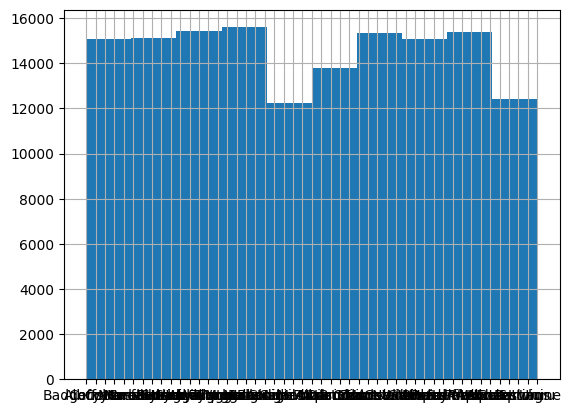

MinTemp


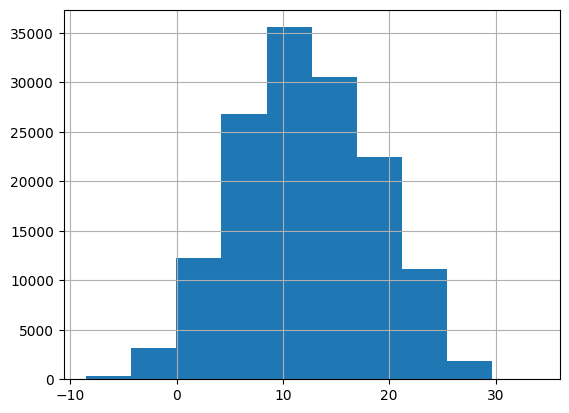

MaxTemp


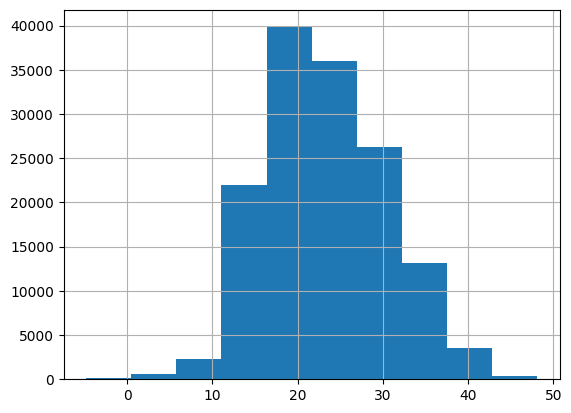

Rainfall


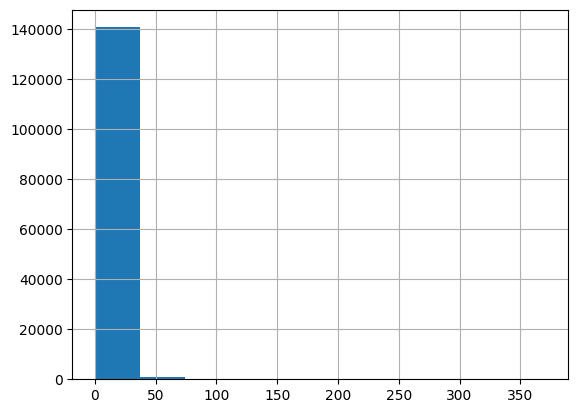

Evaporation


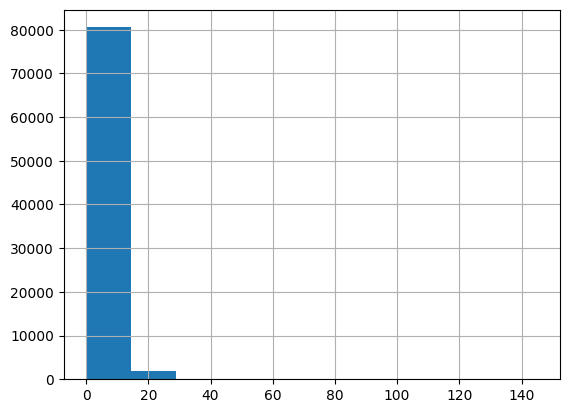

Sunshine


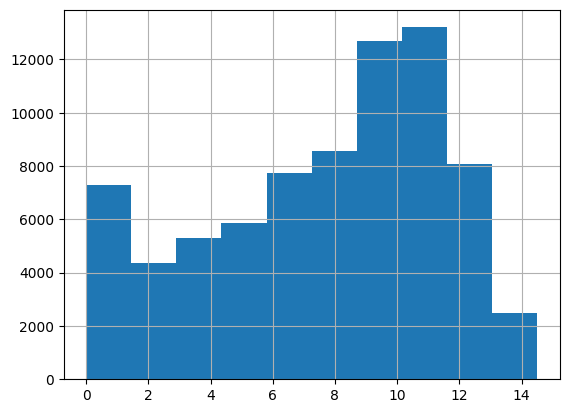

WindGustDir


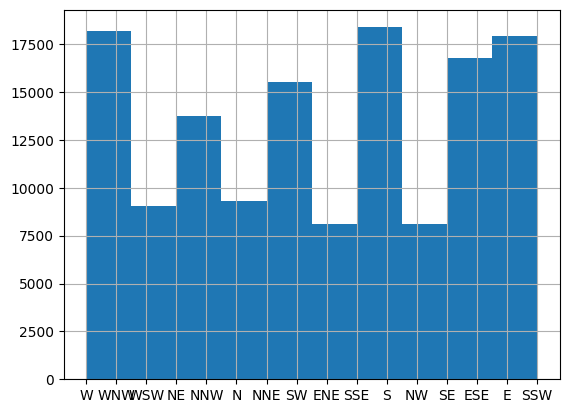

WindGustSpeed


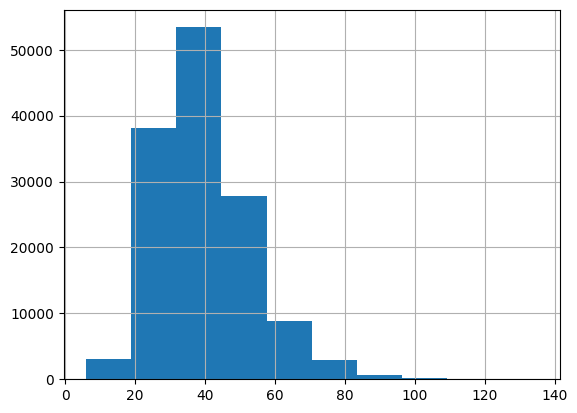

WindDir9am


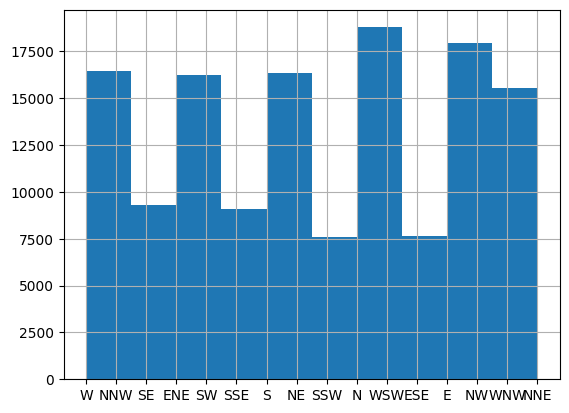

WindDir3pm


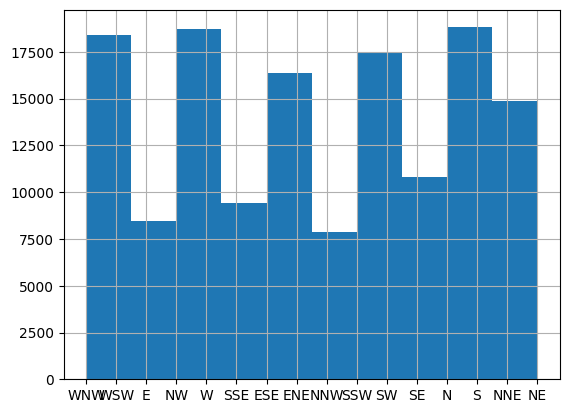

WindSpeed9am


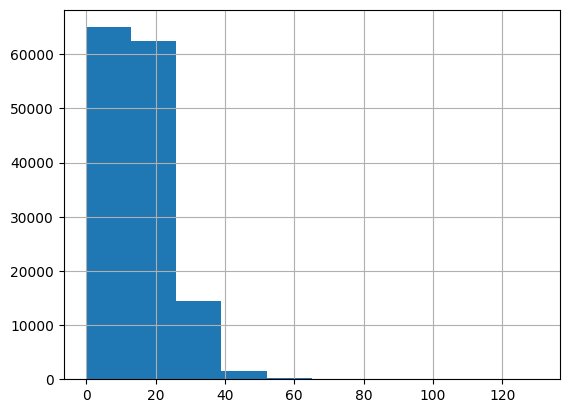

WindSpeed3pm


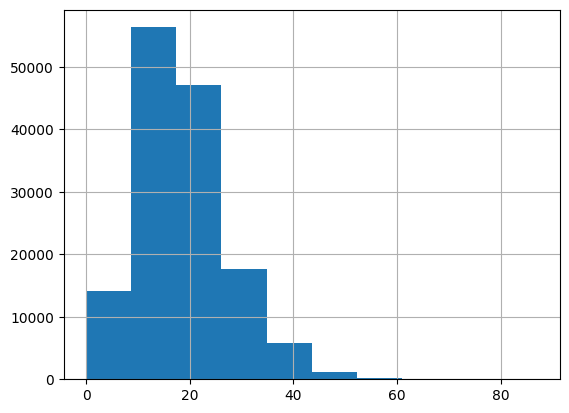

Humidity9am


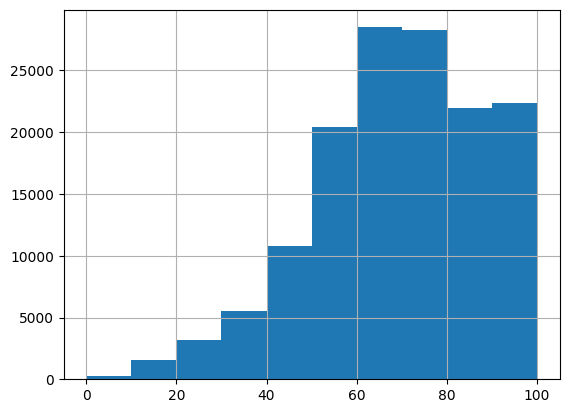

Humidity3pm


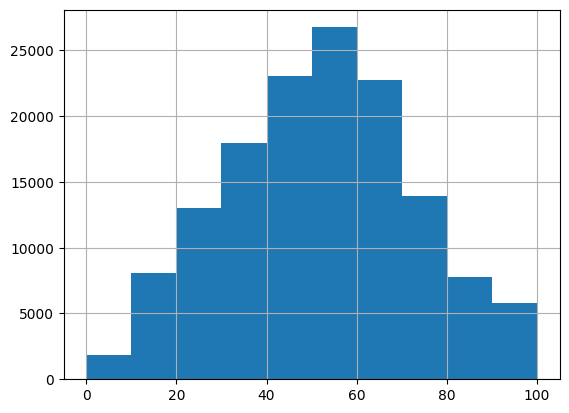

Pressure9am


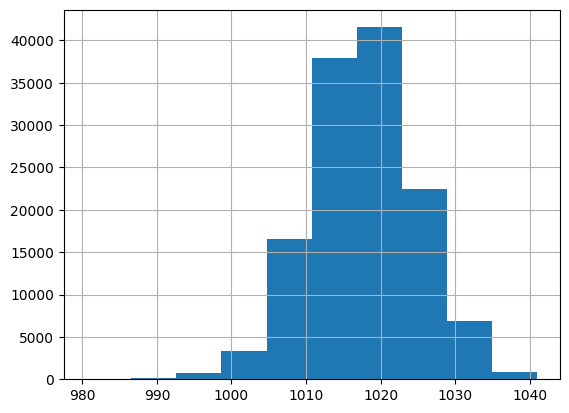

Pressure3pm


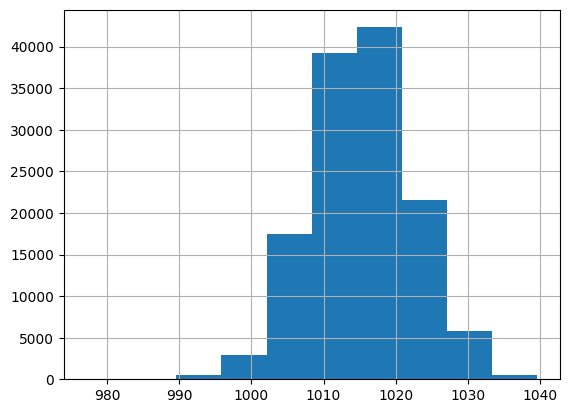

Cloud9am


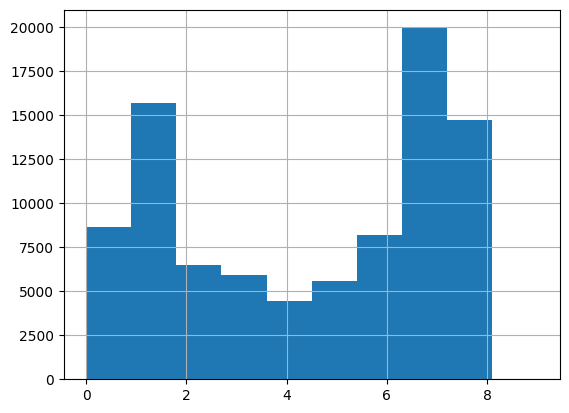

Cloud3pm


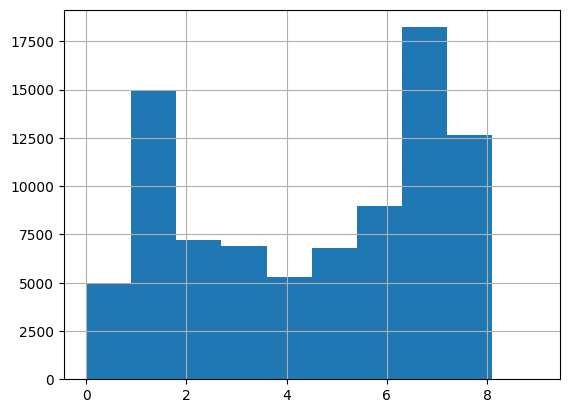

Temp9am


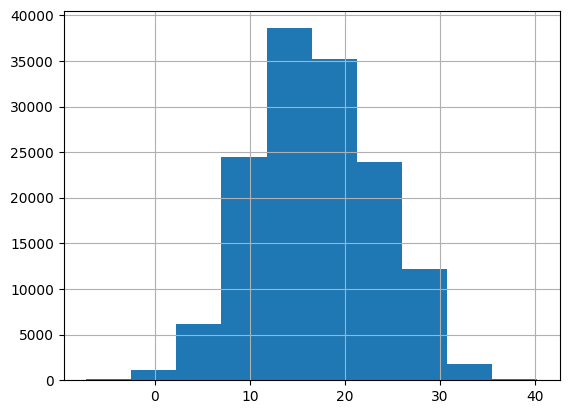

Temp3pm


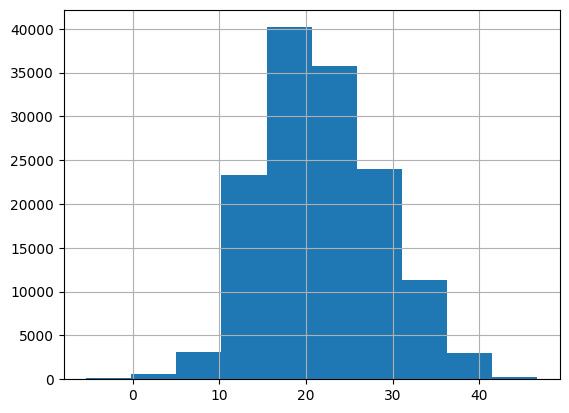

RainToday


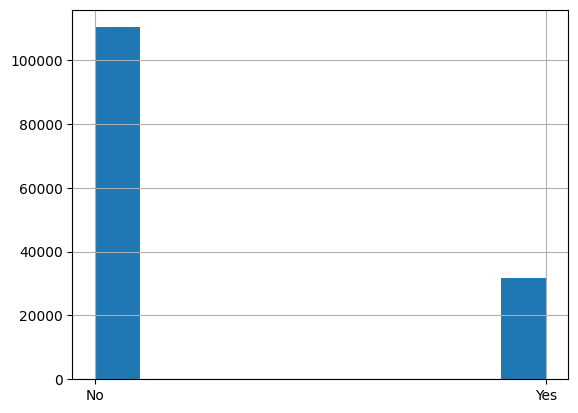

RainTomorrow


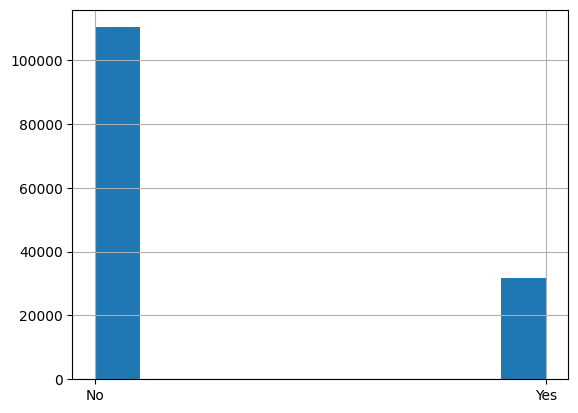

Year


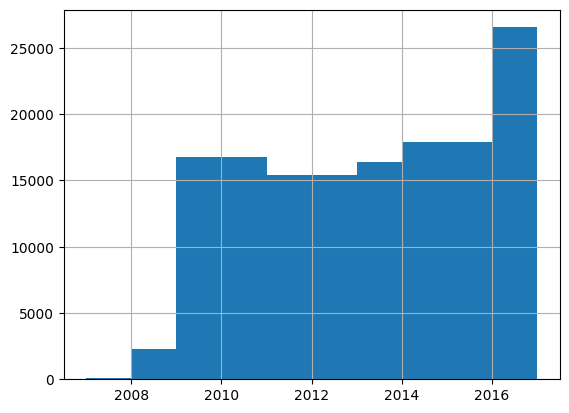

Month


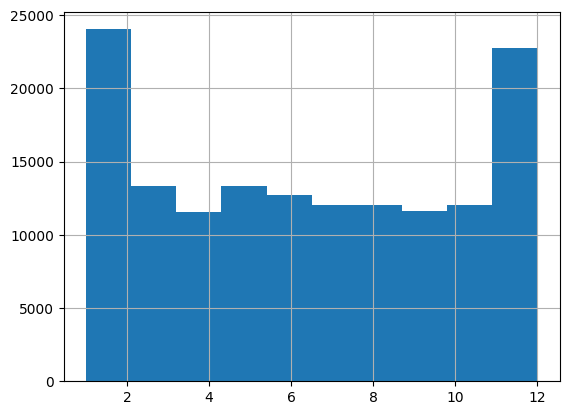

Day


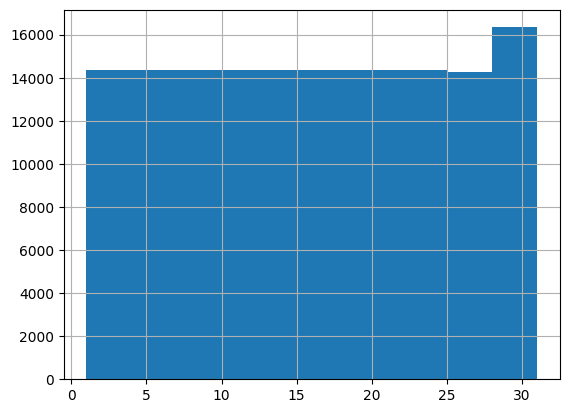

In [ ]:
for i, column in enumerate(data):
    print(column)
    plt.figure(i)
    df[column].hist()
    plt.show()

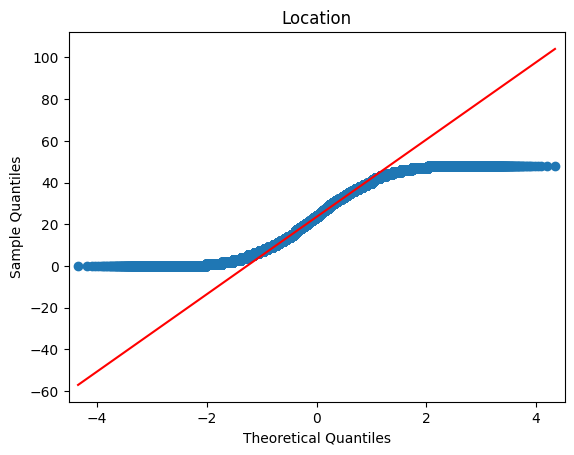

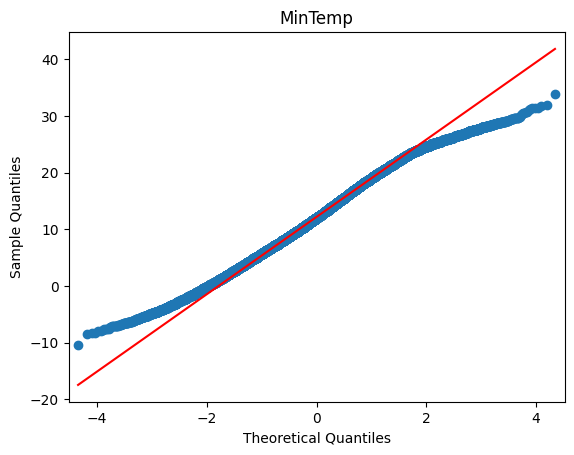

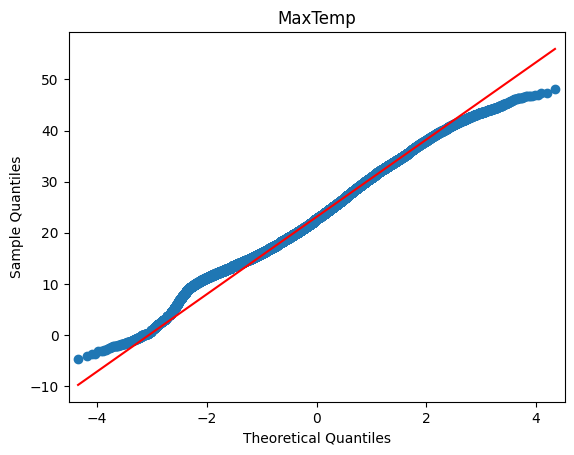

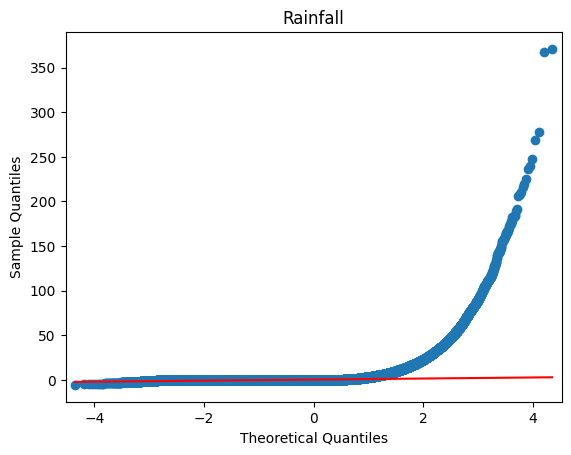

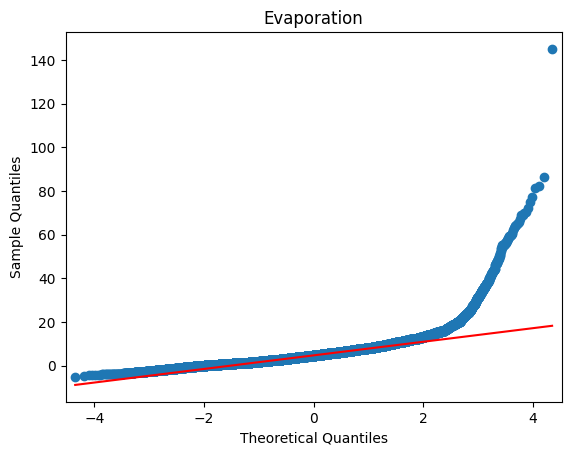

...

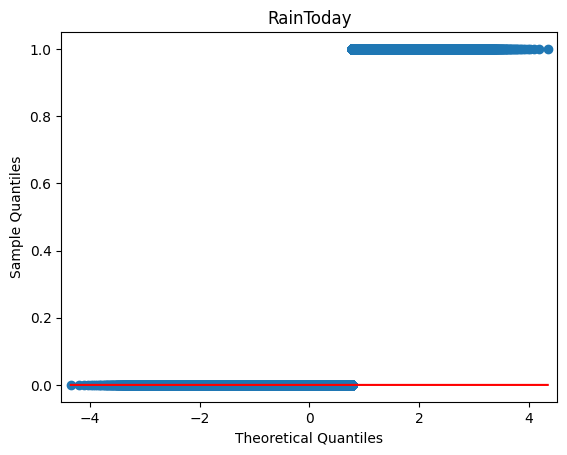

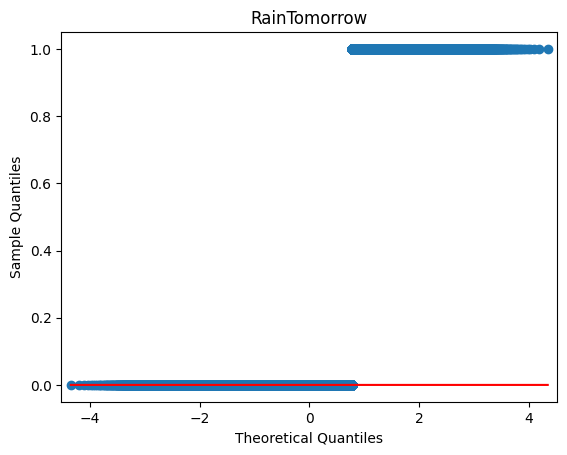

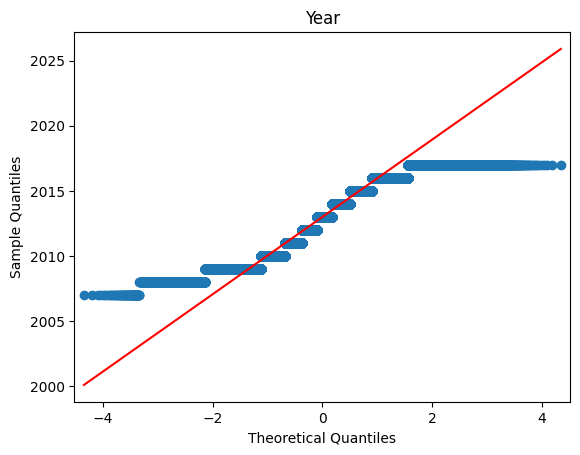

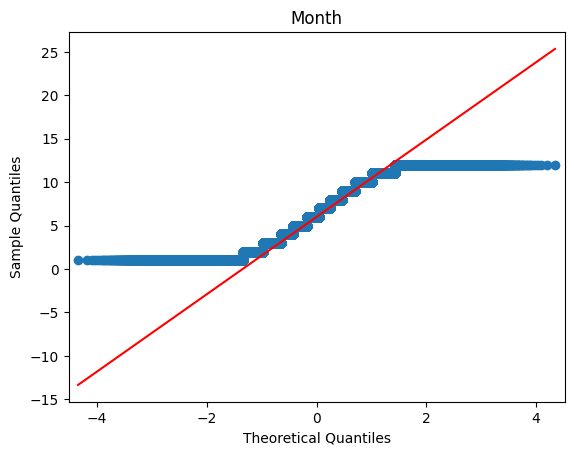

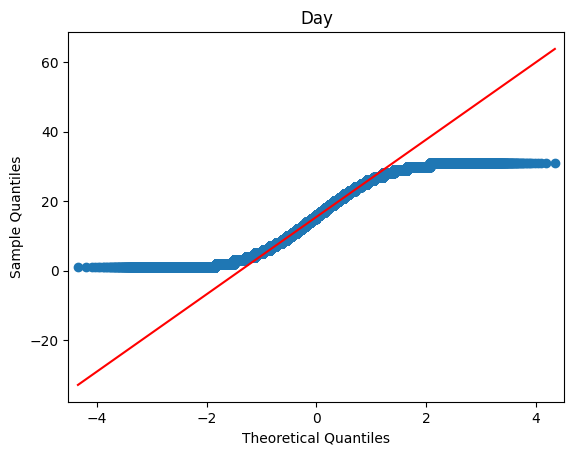

In [ ]:
import statsmodels.api as sm
from scipy.stats import norm
import pylab

for column in data:
    sm.qqplot(data[column], line='q')
    pylab.title(column)
    pylab.show()

## Checking imbalance in target variable

<Axes: xlabel='RainTomorrow', ylabel='count'>

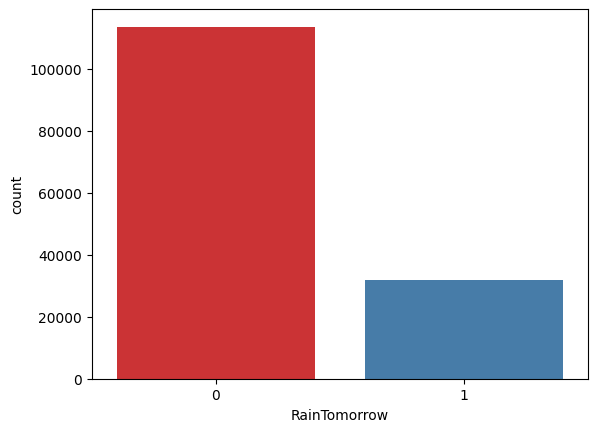

In [ ]:
sns.countplot(x='RainTomorrow', data = data, palette = "Set1")

In [ ]:
for column in data[features]:
  # Calculate the frequency of each category
  freq = data[column].value_counts()
  print(column)
  # Print the frequency of each category
  print(freq)
  print("")

Location
9     3436
37    3344
13    3193
18    3193
7     3193
0     3193
31    3193
15    3193
1     3040
22    3040
5     3040
39    3040
14    3040
8     3040
17    3040
3     3040
6     3040
2     3040
23    3040
47    3040
24    3039
40    3039
30    3039
48    3009
28    3009
10    3009
11    3009
21    3009
35    3009
32    3009
29    3009
46    3009
4     3009
20    3009
27    3009
19    3009
34    3009
38    3009
42    3009
45    3009
12    3009
44    3009
33    3009
43    3006
26    3004
36    3001
16    1578
25    1578
41    1578
Name: Location, dtype: int64

WindGustDir
13    20241
9      9418
3      9313
10     9216
0      9181
8      9168
15     9069
12     8967
11     8736
14     8252
7      8122
1      8104
2      7372
4      7133
6      6620
5      6548
Name: WindGustDir, dtype: int64

WindDir9am
3     22324
9      9287
0      9176
10     9112
7      8749
8      8659
13     8459
12     8423
5      8129
6      7980
1      7836
4      7671
2      7630
11     7587
14    

In [ ]:
normalized_data = data.copy()
for column in normalized_data[features]:
  # Calculate the frequency of each category
  freq = normalized_data[column].value_counts(normalize=True)
  print(column)
  # Print the frequency of each category
  print(freq)
  print("")

Location
9     0.023622
37    0.022989
13    0.021951
18    0.021951
7     0.021951
0     0.021951
31    0.021951
15    0.021951
1     0.020899
22    0.020899
5     0.020899
39    0.020899
14    0.020899
8     0.020899
17    0.020899
3     0.020899
6     0.020899
2     0.020899
23    0.020899
47    0.020899
24    0.020892
40    0.020892
30    0.020892
48    0.020686
28    0.020686
10    0.020686
11    0.020686
21    0.020686
35    0.020686
32    0.020686
29    0.020686
46    0.020686
4     0.020686
20    0.020686
27    0.020686
19    0.020686
34    0.020686
38    0.020686
42    0.020686
45    0.020686
12    0.020686
44    0.020686
33    0.020686
43    0.020665
26    0.020652
36    0.020631
16    0.010848
25    0.010848
41    0.010848
Name: Location, dtype: float64

WindGustDir
13    0.139152
9     0.064746
3     0.064024
10    0.063358
0     0.063117
8     0.063028
15    0.062347
12    0.061646
11    0.060058
14    0.056730
7     0.055837
1     0.055713
2     0.050681
4     0.049038
6 

[Text(0.5, 1.0, 'RainTomorrow Indicator No(0) and Yes(1) after Oversampling (Balanced Dataset)')]

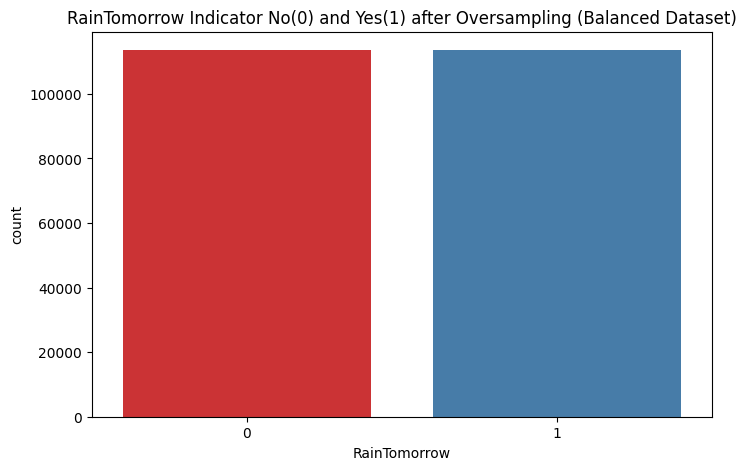

In [ ]:
from sklearn.utils import resample

no = normalized_data[normalized_data.RainTomorrow == 0]
yes = normalized_data[normalized_data.RainTomorrow == 1]
yes_oversampled = resample(yes, replace=True, n_samples=len(no), random_state=123)
oversampled_data = pd.concat([no, yes_oversampled])

fig = plt.figure(figsize = (8,5))
sns.countplot(x='RainTomorrow', data = oversampled_data, palette = "Set1").set(title='RainTomorrow Indicator No(0) and Yes(1) after Oversampling (Balanced Dataset)')


## Normalization is required for logistic regression

<Axes: >

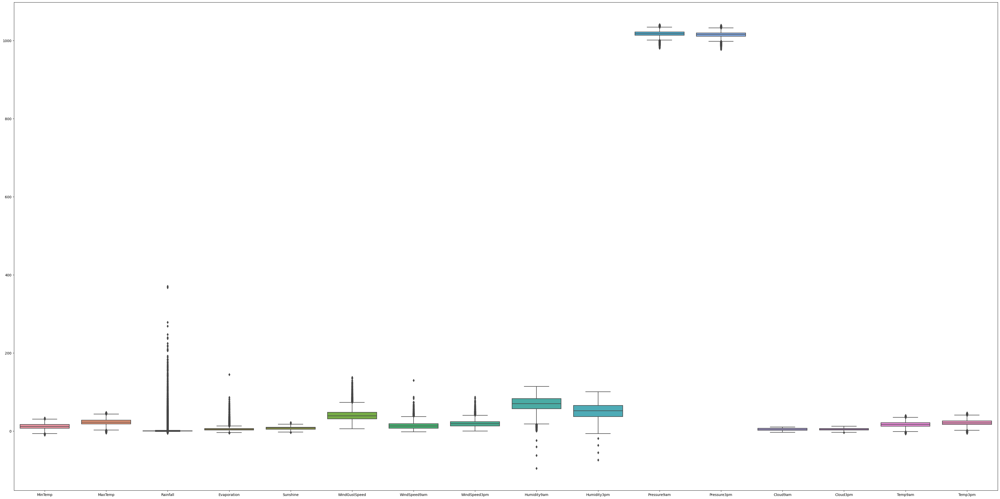

In [ ]:
#Checking the Ranges of the predictor variables and dependent variable

plt.figure(figsize=(50,25))
sns.boxplot(data=normalized_data[numerical_columns])


In [ ]:

from sklearn import preprocessing

scaled_data = normalized_data.copy()

r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(scaled_data[numerical_columns])
scaled_data[numerical_columns] = pd.DataFrame(r_scaler.transform(scaled_data[numerical_columns]), index=scaled_data[numerical_columns].index, columns=scaled_data[numerical_columns].columns)


In [ ]:
scaled_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  int64  
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Evaporation    145460 non-null  float64
 5   Sunshine       145460 non-null  float64
 6   WindGustDir    145460 non-null  int64  
 7   WindGustSpeed  145460 non-null  float64
 8   WindDir9am     145460 non-null  int64  
 9   WindDir3pm     145460 non-null  int64  
 10  WindSpeed9am   145460 non-null  float64
 11  WindSpeed3pm   145460 non-null  float64
 12  Humidity9am    145460 non-null  float64
 13  Humidity3pm    145460 non-null  float64
 14  Pressure9am    145460 non-null  float64
 15  Pressure3pm    145460 non-null  float64
 16  Cloud9am       145460 non-null  float64
 17  Cloud3pm       145460 non-nul

<Axes: >

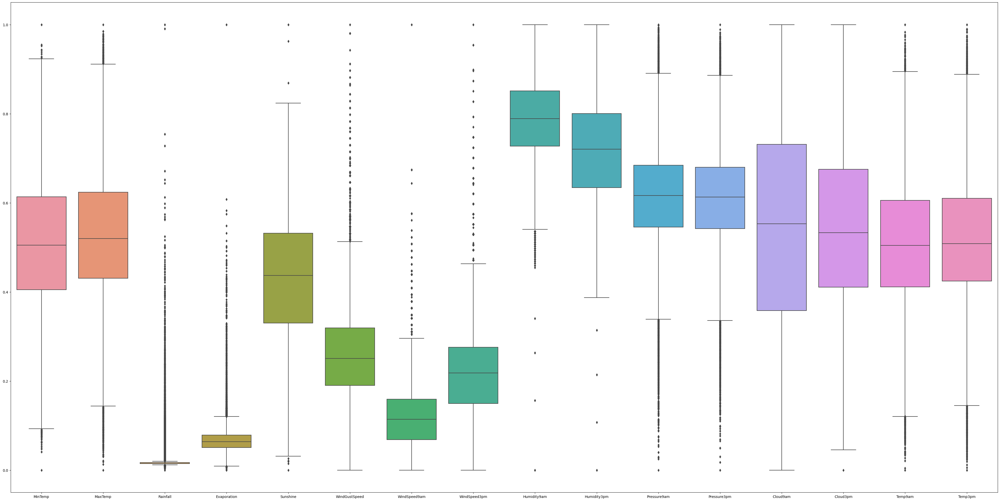

In [ ]:
plt.figure(figsize=(50,25))
sns.boxplot(data=scaled_data[numerical_columns])


## Check for correlation among independant variables

<Axes: >

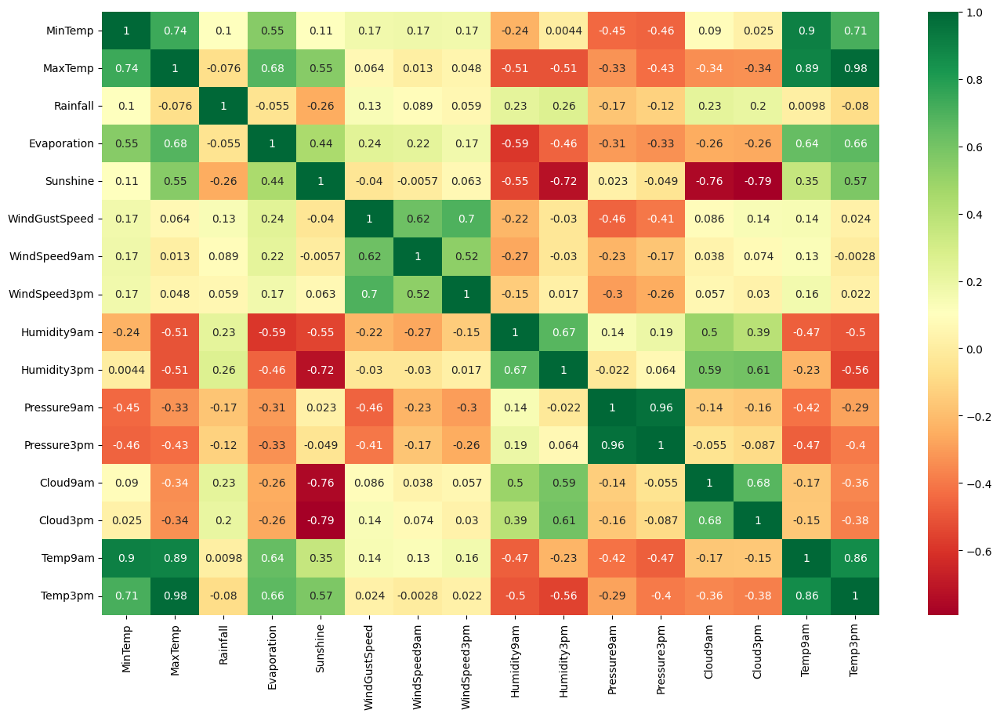

In [ ]:
#the heat map of the correlation
plt.figure(figsize=(16,10))
sns.heatmap(scaled_data[numerical_columns].corr(), annot=True, cmap='RdYlGn')

#Data Splitting



In [ ]:
from sklearn.model_selection import train_test_split

X = scaled_data.drop("RainTomorrow", axis=1)
y = scaled_data["RainTomorrow"]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(X, y, test_size=0.2, random_state=0)
X_train_kbest, X_test_kbest, y_train_kbest, y_test_kbest = train_test_split(X, y, test_size=0.2, random_state=0)


In [ ]:
X_train_shap = shap.utils.sample(X_train, 100)
X_test_shap = shap.utils.sample(X_test, 100)

# Linear Statistical Modelling

## Fit a linear model and interpret the regression coefficients

## OLS Classification

In [ ]:
import statsmodels.api as sm

X_OLS_train = scaled_data.drop(["RainTomorrow","Temp9am","Day"], axis=1)
y_OLS_train = scaled_data["RainTomorrow"]


X_OLS_train = sm.add_constant(X_OLS_train)
model = sm.OLS(y_OLS_train, X_OLS_train)
results = model.fit()
print(results.params) 


const            1.818636
Location        -0.000312
MinTemp         -0.224532
MaxTemp          0.409566
Rainfall         0.538891
Evaporation      0.300930
Sunshine        -0.691244
WindGustDir      0.000491
WindGustSpeed    0.935116
WindDir9am      -0.001946
WindDir3pm       0.001659
WindSpeed9am    -0.098291
WindSpeed3pm    -0.357843
Humidity9am     -0.103324
Humidity3pm      1.277671
Pressure9am      1.093327
Pressure3pm     -1.633713
Cloud9am        -0.101737
Cloud3pm         0.054716
Temp3pm         -0.066130
RainToday        0.111676
Year            -0.001028
Month            0.001183
dtype: float64


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           RainTomorrow   R-squared:                       0.321
Model:                            OLS   Adj. R-squared:                  0.321
Method:                 Least Squares   F-statistic:                     3131.
Date:                Sun, 09 Apr 2023   Prob (F-statistic):               0.00
Time:                        16:48:55   Log-Likelihood:                -49802.
No. Observations:              145460   AIC:                         9.965e+04
Df Residuals:                  145437   BIC:                         9.988e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.8186      0.716      2.538      0.011       0.414       3.223
Location         -0.0003   6.34e-05     -4.924      0.000      -0.000      -0.000
MinTemp          -0.2245      0.016    -14.237      0.000      -0.255      -0.194
MaxTemp           0.4096      0.046      8.928      0.000       0.320       0.499
Rainfall          0.5389      0.047     11.380      0.000       0.446       0.632
Evaporation       0.3009      0.057      5.248      0.000       0.189       0.413
Sunshine         -0.6912      0.016    -43.133      0.000      -0.723      -0.660
WindGustDir       0.0005      0.000      2.034      0.042    1.79e-05       0.001
WindGustSpeed     0.9351      0.015     61.626      0.000       0.905       0.965
WindDir9am       -0.0019      0.000     -8.689      0.000      -0.002      -0.002
WindDir3pm        0.0017      0.000      6.603      0.000       0.001       0.002
WindSpeed9am     -0.0983      0.019     -5.306      0.000      -0.135      -0.062
WindSpeed3pm     -0.3578      0.013    -27.027      0.000      -0.384      -0.332
Humidity9am      -0.1033      0.017     -6.106      0.000      -0.136      -0.070
Humidity3pm       1.2777      0.017     73.312      0.000       1.244       1.312
Pressure9am       1.0933      0.038     28.458      0.000       1.018       1.169
Pressure3pm      -1.6337      0.039    -41.504      0.000      -1.711      -1.557
Cloud9am         -0.1017      0.008    -12.592      0.000      -0.118      -0.086
Cloud3pm          0.0547      0.011      5.070      0.000       0.034       0.076
Temp3pm          -0.0661      0.049     -1.342      0.180      -0.163       0.030
RainToday         0.1117      0.003     40.568      0.000       0.106       0.117
Year             -0.0010      0.000     -2.883      0.004      -0.002      -0.000
Month             0.0012      0.000      4.281      0.000       0.001       0.002
==============================================================================
Omnibus:                    13980.682   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18353.836
Skew:                           0.841   Prob(JB):                         0.00
Kurtosis:                       3.448   Cond. No.                     1.61e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.61e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We are able to reject the null hypothesis as the probability in F statistic is 0.  

There are a few features like MinTemp, MaxTemp, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am and Temp3pm which show non-zero correlation as per Ordinary Least Squares regression model as they have a high p-value.

From the table we also see that all the features have very corerlation with the target. The fetaures Year, Rainfall, Evaporation, and WindGustDir have somewhat positive correlation with the target variable whereas MaxTemp and WindDir3pm have negative coefficient. All other features have a very low correlation coefficient.

## Logistic Regression Model

Mathematical relationships can be used to understand how variables are related to each other. In experimental research, we often collect data to understand these relationships and make predictions. One way to do this is by using linear models.  

Linear models are equations that describe how one variable (the response variable) is related to one or more other variables (predictor variables). Linear regression is a statistical method that helps us create these models.  

For example, if we are interested in understanding how a person's height (predictor variable) is related to their weight (response variable), we can use linear regression to create a model that describes this relationship. The model will take into account any other relevant variables (such as age, gender, or lifestyle factors) that may also be related to weight. The relationship is fit into a linear equation:  
  > y=β0+∑ βiXi+ϵi 


By analyzing the data and fitting a linear regression model, we can estimate the coefficients (represented by beta) that describe the relationship between the predictor variable(s) and the response variable. We can then use this model to predict the response variable for new values of the predictor variable(s) that were not included in the original data set.  

Overall, linear models and regression analysis are powerful tools for understanding the relationships between variables, making predictions, and informing decision-making in a wide range of fields, including science, finance, and medicine.  

In [ ]:
# train a logistic regression model on the training set
from sklearn.linear_model import LogisticRegression


# instantiate the model
logreg = LogisticRegression(solver='liblinear', random_state=0)

# fit the model
lr_model  = logreg.fit(X_train, y_train)

In [ ]:
y_pred_test = logreg.predict(X_test)
print(y_pred_test)

[0 0 0 ... 1 0 0]


In [ ]:
# probability of getting output as 0 - no rain
proba_0 = logreg.predict_proba(X_test)[:,0]

# probability of getting output as 1 - rain
prob_1 = logreg.predict_proba(X_test)[:,1]

In [ ]:
print("Probability of no Rain", proba_0)
print("Probability of Rain", prob_1)
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Probability of no Rain [0.74441107 0.81819868 0.89019962 ... 0.39846061 0.7423974  0.97301733]
Probability of Rain [0.25558893 0.18180132 0.10980038 ... 0.60153939 0.2576026  0.02698267]
Model accuracy score: 0.8338


In [ ]:
print(lr_model.coef_)

[[-1.36651544e-04  8.31065089e-01 -3.68023009e-01  1.59621653e-01
  -1.00852802e-01 -2.44306426e+00  8.92244121e-03  1.57901287e+00
  -2.79588031e-02 -1.45164655e-02  2.26468599e-01  4.23409520e-01
   7.59411951e-01  2.70560619e+00 -1.56301271e+00 -1.67465417e+00
   1.58262044e+00  2.41609156e+00  4.35489667e-01 -7.12664083e-01
   7.35579851e-01 -2.01301626e-03  1.74245627e-02 -8.58445688e-05]]


### SHAP Analysis for Logistic Regression Model

When we use machine learning models to make predictions, it can be difficult to understand how the model arrived at a particular prediction. This is where SHAP comes in.  

SHAP is a method that breaks down a machine learning model's prediction into contributions from each input variable (or "feature"). For each instance in the data, SHAP calculates how much each feature contributes to the prediction, based on the values of the features for that instance.  

This can help us understand which features are most important for a particular prediction, and how they interact with each other. For example, if we are trying to predict the price of a house, SHAP can tell us how much the number of bedrooms, the location, and other features contribute to the final predicted price.  

To make these contributions easier to understand, SHAP presents them as a "summary plot", which shows the features that have the greatest impact on the prediction, as well as the direction of their impact (positive or negative). This can help us identify patterns and relationships in the data, and make better-informed decisions based on the model's predictions.  

Overall, SHAP is a powerful tool for explaining how machine learning models make predictions, and can help us better understand and interpret these models in a wide range of applications.  

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


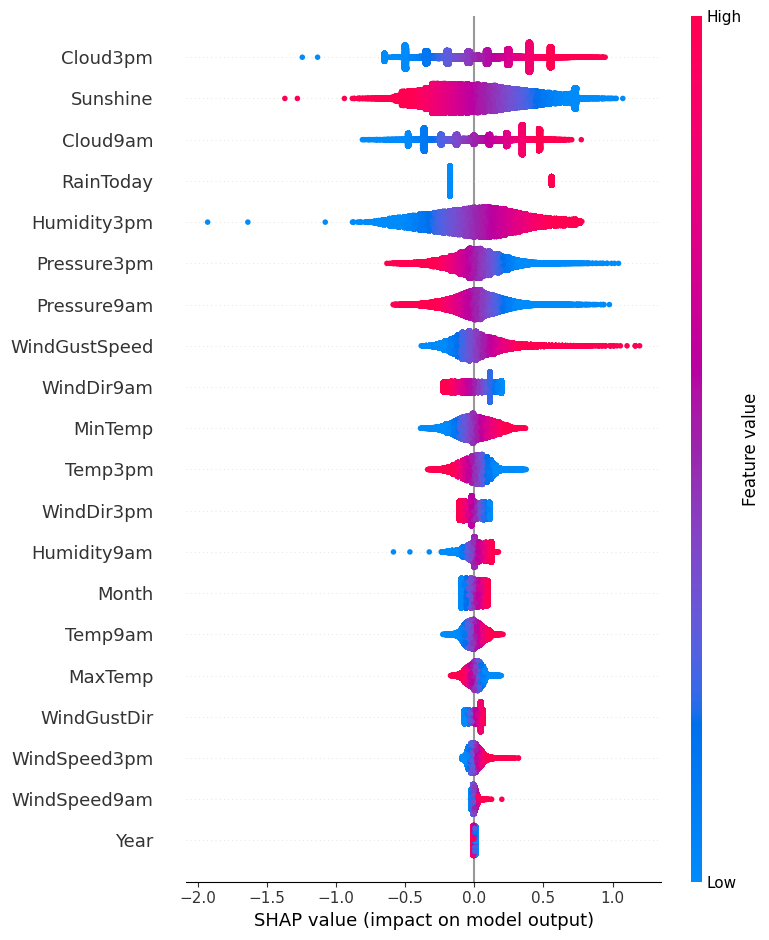

In [ ]:
explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = explainer.shap_values(X_train)

shap.summary_plot(linear_shap_values, X_train, feature_names=X_train.columns)


From the SHAP plot, we can see that high values of Cloud3pm, Cloud9am and Humidity3pm have high impact on Rain prediction, whereas low values of Pressure9am, Pressure3pm, and Sunshine also have a positive impact on Rain as is expected.

## Feature Selection Using RFE (Recursive Feature Elimination)

In [ ]:
rfe = RFE(lr_model, n_features_to_select=10)
rfe.fit(X_train_rfe, y_train)

RFE(estimator=LogisticRegression(random_state=0, solver='liblinear'),
    n_features_to_select=10)

In [ ]:
y_pred_test_rfe = rfe.predict(X_test_rfe)
print(y_pred_test_rfe)

[0 0 0 ... 0 0 0]


In [ ]:
# probability of getting output as 0 - no rain
proba_0_rfe = rfe.predict_proba(X_test_rfe)[:,0]

# probability of getting output as 1 - rain
prob_1_rfe = rfe.predict_proba(X_test_rfe)[:,1]

In [ ]:
print("Probability of no Rain", proba_0_rfe)
print("Probability of Rain", prob_1_rfe)
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_rfe, y_pred_test_rfe)))

Probability of no Rain [0.88875442 0.80518542 0.84725775 ... 0.50706611 0.76218045 0.96392842]
Probability of Rain [0.11124558 0.19481458 0.15274225 ... 0.49293389 0.23781955 0.03607158]
Model accuracy score: 0.8433


## Feature Selection using KBest features

In [ ]:
selector = SelectKBest(chi2, k=10)
selector.fit(X_train_kbest, y_train)
X_new = selector.transform(X_train_kbest)
Kbest = X_train_kbest.columns[selector.get_support(indices=True)]

In [ ]:
Kbest

Index(['Rainfall', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'RainToday'],
      dtype='object')

In [ ]:
X_train_kbest

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
22926,27,0.658545,0.538752,0.015368,0.066668,0.421647,2,0.349623,2,2,...,0.596694,0.5888,0.582190,0.680332,0.603376,0.529750,0,2014,3,12
80735,44,0.443722,0.544423,0.015368,0.044001,0.560992,4,0.319221,6,5,...,0.624793,0.6000,0.432917,0.556226,0.453586,0.548944,0,2016,10,6
121764,31,0.479902,0.510397,0.018555,0.041335,0.510673,12,0.152010,3,12,...,0.613223,0.6048,0.283645,0.370066,0.502110,0.516315,1,2011,8,31
139821,13,0.669851,0.655955,0.014837,0.094668,0.564863,2,0.281219,2,0,...,0.585124,0.5600,0.283645,0.308013,0.641350,0.662188,0,2010,6,11
1867,2,0.588444,0.423440,0.047764,0.036977,0.176279,0,0.106407,2,0,...,0.573554,0.5344,0.806099,0.742385,0.500000,0.435701,1,2014,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41993,45,0.635932,0.810964,0.014837,0.206668,0.667647,4,0.250817,5,0,...,0.561983,0.5216,0.283645,0.308013,0.687764,0.809981,0,2015,12,20
97639,0,0.516083,0.606805,0.014837,0.078367,0.526156,13,0.182412,3,14,...,0.639669,0.6432,0.447086,0.416947,0.510549,0.612284,0,2012,3,11
95939,39,0.617841,0.654064,0.014837,0.070668,0.485929,1,0.121608,7,1,...,0.646281,0.6240,0.488346,0.473530,0.660338,0.660269,0,2016,6,10
117952,32,0.502515,0.506616,0.024928,0.074668,0.437130,11,0.220415,10,14,...,0.652893,0.6624,0.731463,0.618279,0.512658,0.481766,1,2009,11,20


In [ ]:
# fit the model
lr_model_kbest  = logreg.fit(X_train_kbest[Kbest], y_train_kbest)

In [ ]:
y_pred_test_kbest = rfe.predict(X_test_kbest)
print(y_pred_test_kbest)

[0 0 0 ... 0 0 0]


In [ ]:
# probability of getting output as 0 - no rain
proba_0_kbest = rfe.predict_proba(X_test_kbest)[:,0]

# probability of getting output as 1 - rain
prob_1_kbest = rfe.predict_proba(X_test_kbest)[:,1]

In [ ]:
print("Probability of no Rain", proba_0_kbest)
print("Probability of Rain", prob_1_kbest)
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_kbest, y_pred_test_kbest)))

Probability of no Rain [0.88875442 0.80518542 0.84725775 ... 0.50706611 0.76218045 0.96392842]
Probability of Rain [0.11124558 0.19481458 0.15274225 ... 0.49293389 0.23781955 0.03607158]
Model accuracy score: 0.8433


Confusion matrix

 [[21567  1159]
 [ 3399  2967]]
True Positives(TP) =  21567
True Negatives(TN) =  2967
False Positives(FP) =  1159
False Negatives(FN) =  3399


<Axes: >

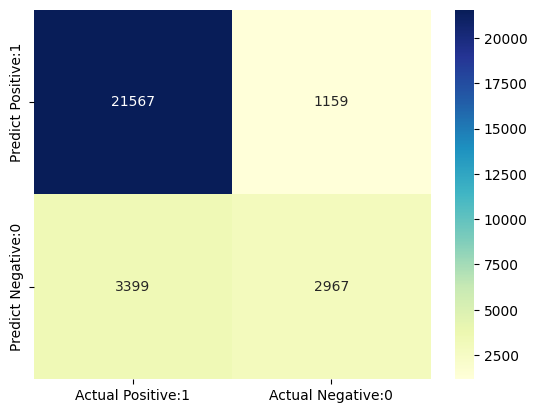

In [ ]:
# Print the Confusion Matrix and slice it into four pieces
cm = confusion_matrix(y_test_kbest, y_pred_test_kbest)
print('Confusion matrix\n\n', cm)
print('True Positives(TP) = ', cm[0,0])
print('True Negatives(TN) = ', cm[1,1])
print('False Positives(FP) = ', cm[0,1])
print('False Negatives(FN) = ', cm[1,0])

# visualize confusion matrix with seaborn he[atmap
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


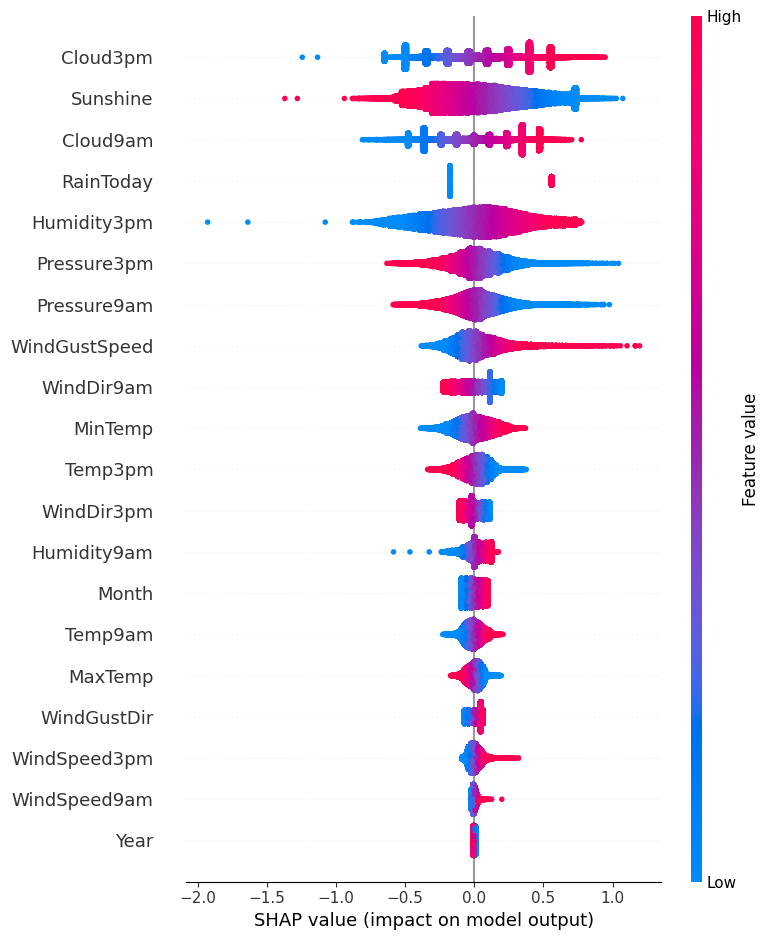

In [ ]:
explainer_kbest = shap.LinearExplainer(lr_model_kbest, X_train_kbest[Kbest])
linear_shap_values_kbest = explainer.shap_values(X_train_kbest)

shap.summary_plot(linear_shap_values_kbest, X_train_kbest, feature_names=X_train_kbest.columns)

## LIME explanation of Logistic Regression

In [ ]:
lime_linear_explainer = lime_tabular.LimeTabularExplainer(X_train_kbest[Kbest].values[:,:], mode="classification",
                              feature_names = X_train_kbest[Kbest].columns, class_names = y_train.unique(),
                              discretizer='decile', kernel_width=5, discretize_continuous=True,verbose=True)

In [ ]:
# Getting LIME interpretation for a sample data
np_x_test = np.zeros(X_train_kbest[Kbest].shape)
np_x_test[:,0:25] = X_train_kbest[Kbest]

np_y_test = np.array(y_pred_test_kbest)

print("Prediction : ", lr_model.predict(X_train_kbest[Kbest]))
print("Actual :     ", y_pred_test_kbest)

Prediction :  [0 0 0 ... 0 0 0]
Actual :      [0 0 0 ... 0 0 0]


In [ ]:
lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[0], lr_model.predict_proba, num_features=24
)
lime_linear_explanation


Intercept 0.22087882131835201
Prediction_local [0.43825091]
Right: 0.4851178251698267


X does not have valid feature names, but LogisticRegression was fitted with feature names


In [ ]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

# Fit a tree-based model and interpret the nodes

## Random Forest Classifier

In [ ]:
# Initializing Random Forest Classifier
RandForest_RFE = RandomForestClassifier() 
# Initializing the RFE object, one of the most important arguments is the estimator, in this case is RandomForest
rfe = RFE(estimator=RandForest_RFE, n_features_to_select=10, step=5)
# Fit the origial dataset
rfe = rfe.fit(X_train, y_train)

In [ ]:
rfe.get_feature_names_out()

array(['Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed',
       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',
       'Cloud9am', 'Cloud3pm'], dtype=object)

In [ ]:
# Generating x_train and x_test based on the best features given by RFE
X_train_RFE = rfe.transform(X_train)
X_test_RFE = rfe.transform(X_test)

rfc_model = RandomForestClassifier(max_depth=3, n_estimators=100)
rfc_model.fit(X_train_RFE, y_train)

RandomForestClassifier(max_depth=3)

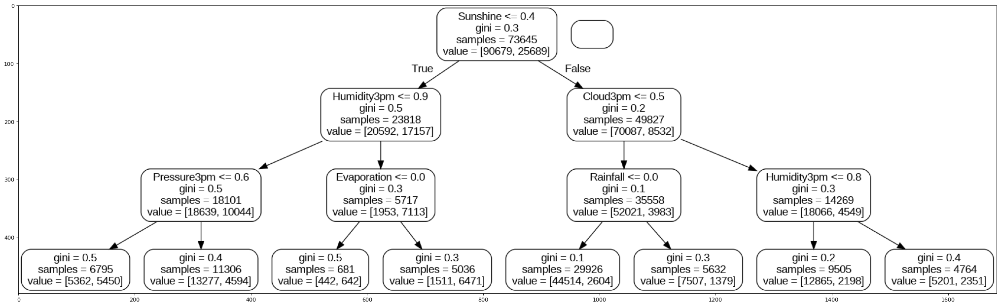

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = rfc_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(rfe.get_feature_names_out()),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

We can observe from the tree node, we can observe branching based on lower Gini impurity.

Accuracy:  0.8317406847243228
Mean squared error: 0.17
Confusion matrix

 [[22018   708]
 [ 4187  2179]]
True Positives(TP) =  22018
True Negatives(TN) =  2179
False Positives(FP) =  708
False Negatives(FN) =  4187
Classification accuracy : 0.8317
Classification error : 0.1683


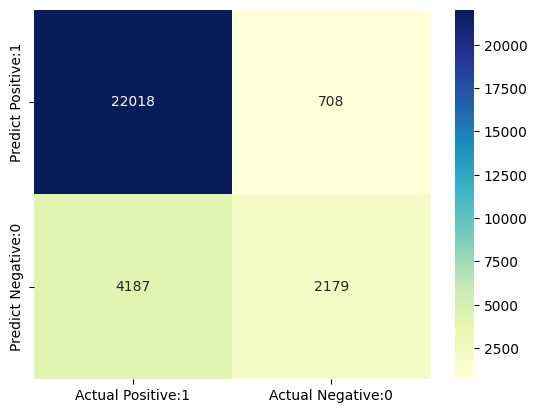

In [ ]:
# Making a prediction and calculting the accuracy
y_pred = rfc_model.predict(X_test_RFE)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: ',accuracy)
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))

# Print the Confusion Matrix and slice it into four pieces
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)
print('True Positives(TP) = ', cm[0,0])
print('True Negatives(TN) = ', cm[1,1])
print('False Positives(FP) = ', cm[0,1])
print('False Negatives(FN) = ', cm[1,0])

# visualize confusion matrix with seaborn he[atmap
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')



# print classification accuracy
classification_accuracy = (cm[0,0] + cm[1,1]) / float(cm[0,0] + cm[1,1] + cm[0,1] + cm[1,0])
print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

# print classification error
classification_error = (cm[0,1] + cm[1,0]) / float(cm[0,0] + cm[1,1] + cm[0,1] + cm[1,0])
print('Classification error : {0:0.4f}'.format(classification_error))


### SHAP Analysis for ensemble model

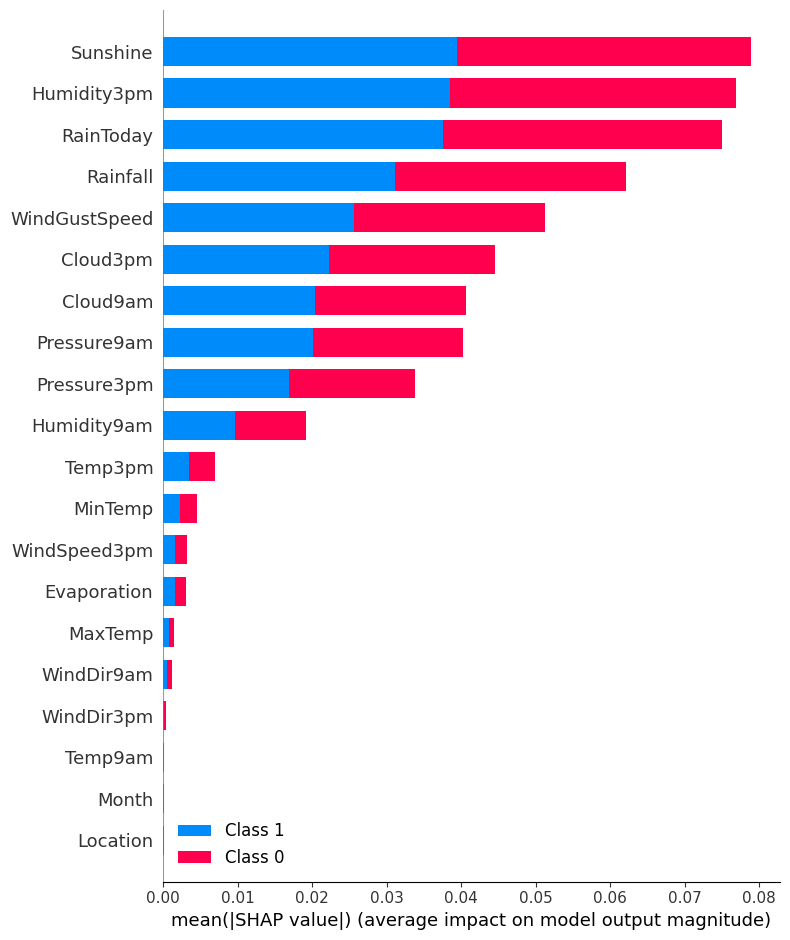

In [ ]:
tree_shap_values = shap.TreeExplainer(rfc_model.fit(X_test, y_test)).shap_values(X_test[:1])
shap.summary_plot(tree_shap_values, X_test, feature_names=X_test.columns)

We can observe Sunshine, Humidity3pm, WindGustSpeed have the most positive impact on target variable, similar to the linear model.

## Decision Tree 

In [ ]:
shap_clf = DecisionTreeClassifier(max_depth = 3, random_state = 42)
shap_clf.fit(X_train, y_train)



DecisionTreeClassifier(max_depth=3, random_state=42)

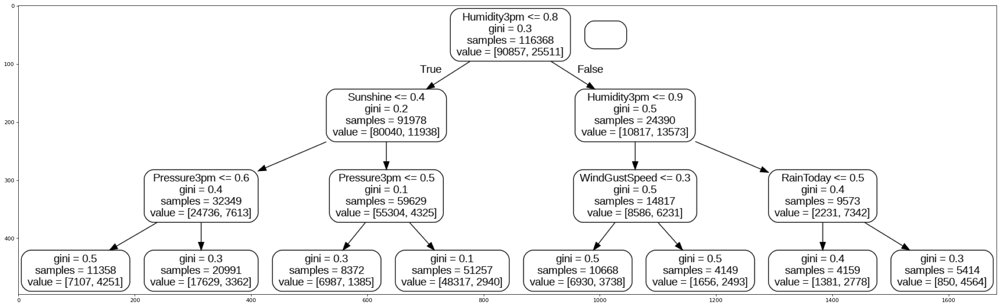

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = shap_clf
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=X_train.columns,
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

In [ ]:
clf = DecisionTreeClassifier(max_depth = 10, random_state = 42)
dt_model = clf.fit(X_train, y_train)

In [ ]:
y_pred_test = clf.predict(X_test)

In [ ]:
metrics.accuracy_score(y_test, y_pred_test)

0.8358655300426234

### SHAP analysis for Decision Tree

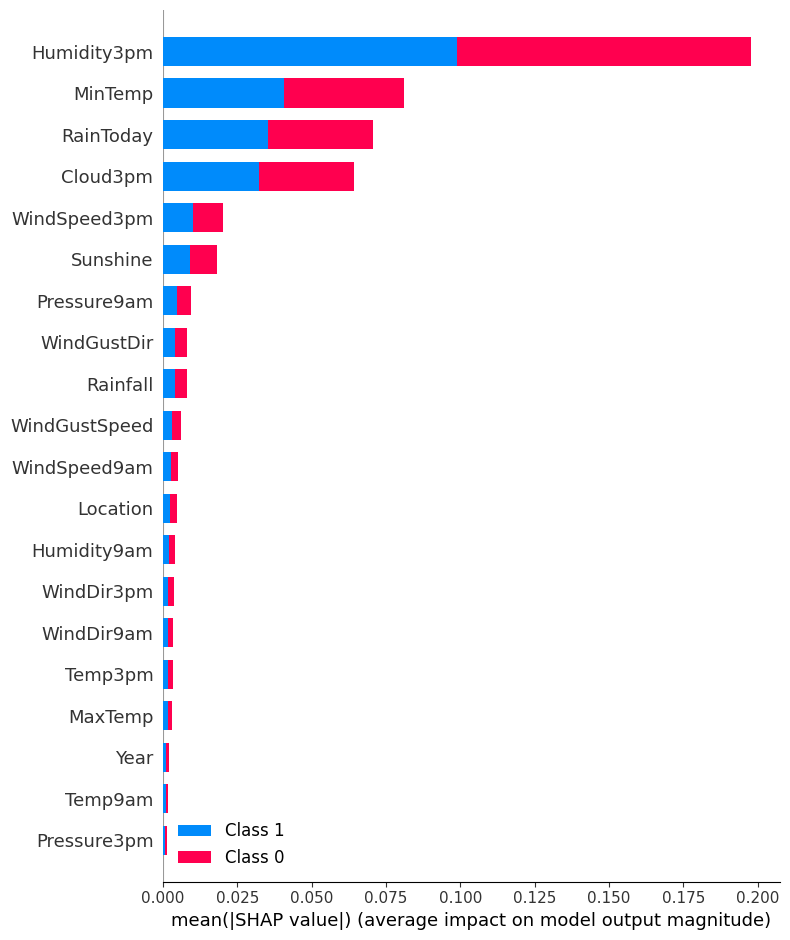

In [ ]:
tree_shap_values = shap.TreeExplainer(clf.fit(X_train, y_train)).shap_values(X_train[:1])
shap.summary_plot(tree_shap_values, X_train, feature_names=X_train.columns)

Shap plot for decision trees are 2 dimensional, and this cannot be represented by beeswarm, however the plot gives information of impact based on each class of target value. Based on decision tree, Humidity3pm, MinTemp, RainToday and CLoud3pm had high impact on both classes of target value. 

## Decision Tree modeling using Kbest features

In [ ]:
clf = DecisionTreeClassifier(max_depth = 10, random_state = 42)
dt_model = clf.fit(X_train_kbest[Kbest], y_train_kbest)

In [ ]:
y_pred_test_kbest = clf.predict(X_test_kbest[Kbest])

In [ ]:
metrics.accuracy_score(y_test, y_pred_test_kbest)

0.8365186305513543

## LIME explanation of Decision Tree

In [ ]:
decision_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[0], dt_model.predict_proba, num_features=24
)
decision_tree_explanation

Intercept 0.2076122704415778
Prediction_local [0.47980875]
Right: 0.9032258064516129


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


In [ ]:
decision_tree_explanation.show_in_notebook()  # Display Results in Notebook

# Use AutoML to find the best model

In [ ]:
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:44849. connected.


H2O_cluster_uptime:,7 mins 35 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_e8qy0a
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,4.944 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
#h2o_data = h2o.import_file(path = local_path)
h2o_data = h2o.H2OFrame(scaled_data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
h2o_data['RainTomorrow'] = h2o_data['RainTomorrow'].asfactor()

In [ ]:
h2o_data_train, h2o_data_test = h2o_data.split_frame([0.8])

In [ ]:
aml = H2OAutoML(sort_metric = 'AUC', nfolds=5, max_runtime_secs=360)

In [ ]:
#Display all columns in X
X=h2o_data_train.columns
print(X)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day']


In [ ]:
#Seperate Dependent variable from Independent variable
y_cat ='RainTomorrow'
X.remove(y_cat) 
print(X)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'Year', 'Month', 'Day']


In [ ]:
aml.train(x=X,y=y_cat,training_frame=h2o_data_train) 

AutoML progress: |███████████████████████████████████████████

In [ ]:
explain_model = aml.explain(frame = h2o_data_test, figsize = (8,6),include_explanations=['leaderboard'])

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_1_AutoML_2_20230409_171336,0.889767,0.328218,0.738333,0.209611,0.319441,0.102042,3197,0.098816,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20230409_171336,0.889763,0.328253,0.738235,0.209192,0.319456,0.102052,4232,0.059019,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_2_20230409_171336,0.889762,0.328252,0.738227,0.209609,0.319456,0.102052,3256,0.062009,StackedEnsemble
GBM_1_AutoML_2_20230409_171336,0.887771,0.331028,0.734471,0.206882,0.320751,0.102881,19692,0.03351,GBM
XGBoost_1_AutoML_2_20230409_171336,0.879534,0.344482,0.716418,0.215269,0.326908,0.106869,16067,0.011699,XGBoost
XGBoost_2_AutoML_2_20230409_171336,0.869306,0.370619,0.698797,0.228004,0.335231,0.11238,3690,0.00343,XGBoost
GBM_2_AutoML_2_20230409_171336,0.86398,0.410675,0.693208,0.230623,0.356916,0.127389,1316,0.006676,GBM
GLM_1_AutoML_2_20230409_171336,0.86374,0.361141,0.679111,0.224088,0.33609,0.112957,7360,0.005117,GLM
GBM_3_AutoML_2_20230409_171336,0.863311,0.418661,0.691546,0.230939,0.361231,0.130488,1319,0.00898,GBM
GBM_4_AutoML_2_20230409_171336,0.85434,0.457797,0.662806,0.24089,0.381934,0.145874,1684,0.005788,GBM


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

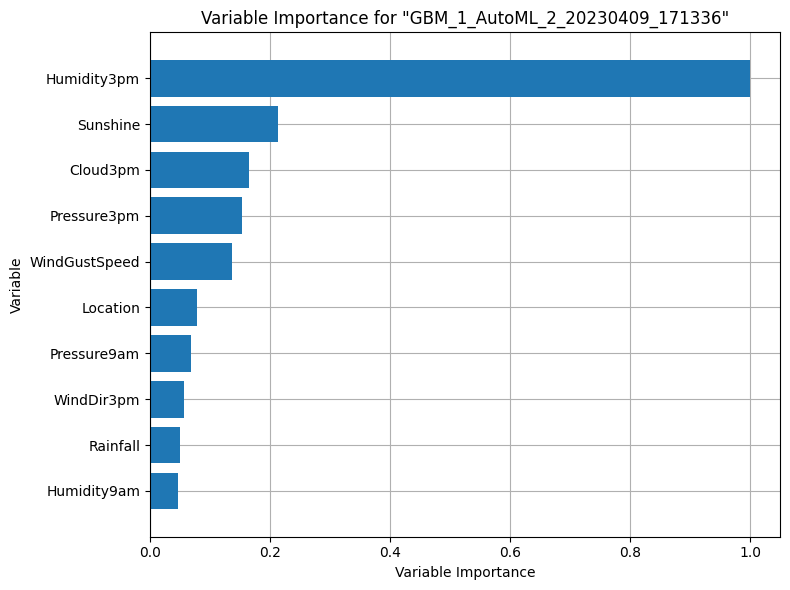

In [ ]:
explain_model = aml.explain(frame = h2o_data_test, figsize = (8,6),include_explanations=['varimp'])

## SHAP Analysis for AUTOML

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

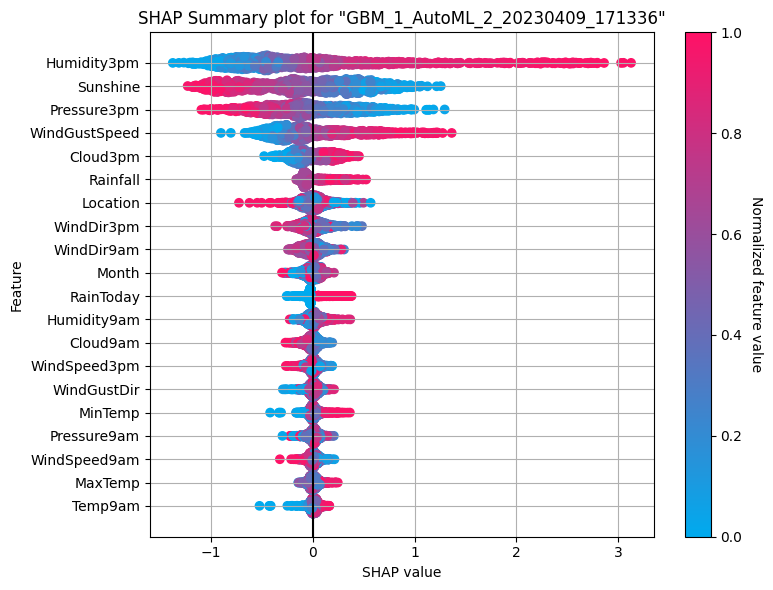

In [ ]:
explain_model = aml.explain(frame = h2o_data_test, figsize = (8,6),include_explanations=['shap_summary'])

## LIME explanation for AUTOML model

In [ ]:
class h2o_predict_proba_wrapper:
    # h2o object, the column_names is the labels of the X values
    def __init__(self,model,column_names):            
        self.model = model
        self.column_names = column_names

    def predict_proba(self,this_array):        
        # If we have just 1 row of data we need to reshape it
        shape_tuple = np.shape(this_array)        
        if len(shape_tuple) == 1:
            this_array = this_array.reshape(1, -1)

       # convert the pandas dataframe to an h2o frame
        self.pandas_df = pd.DataFrame(data = this_array,columns = self.column_names)
        self.h2o_df = h2o.H2OFrame(self.pandas_df)

        # Predict with the h2o model
        self.predictions = self.model.predict(self.h2o_df).as_data_frame()
        # the first column is the class labels, the rest are probabilities for each class
        self.predictions = self.predictions.iloc[:,1:].values
        return self.predictions

In [ ]:
h2o_df = h2o_data_test[X].as_data_frame().values
#np_aml_test = np.zeros(h2o_df.shape)
#np_aml_test[:,0:25] = h2o_df

In [ ]:
classes = h2o_data_train[y_cat].unique().as_data_frame().values


In [ ]:
h2o_drf_wrapper = h2o_predict_proba_wrapper(aml.leader,h2o_data_test)
explainer = lime_tabular.LimeTabularExplainer(h2o_data_train[X].as_data_frame().values, mode="classification",
                              feature_names = X, class_names = classes,
                              verbose=True)

'''
lime_linear_explainer = lime_tabular.LimeTabularExplainer(X_train.values[:,:], mode="classification",
                              feature_names = X_train.columns, class_names = y_train.unique(),
                              discretizer='decile', kernel_width=5, discretize_continuous=True,verbose=True)
                              '''

'\nlime_linear_explainer = lime_tabular.LimeTabularExplainer(X_train.values[:,:], mode="classification",\n                              feature_names = X_train.columns, class_names = y_train.unique(),\n                              discretizer=\'decile\', kernel_width=5, discretize_continuous=True,verbose=True)\n                              '

In [ ]:
h2o_drf_wrapper = h2o_predict_proba_wrapper(aml.leader,X)

h2o_explanation = explainer.explain_instance(
    h2o_df[24], h2o_drf_wrapper.predict_proba, num_features=24
)
h2o_explanation

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Intercept 0.39626978781605515
Prediction_local [-0.14075369]
Right: 0.0134892183504896


In [ ]:
h2o_explanation.show_in_notebook()  # Display Results in Notebook

LIME analysis gives us the prediction probability for each class, and each feature's impact on target variable. However, it is not as detailed in terms of the predictor variable values. It is similar to SHAP but not as detailed.

AutoML was able to find the best model, with Humidity3pm having the most impact unlike linear model, still Humidity3pm, WindGustSpeed, Cloud3pm come at the top with positive impact, while low Sunshine, Pressure3pm show impact as well.

# Other Model Interpretabiity methods

## Partial Dependance Plots

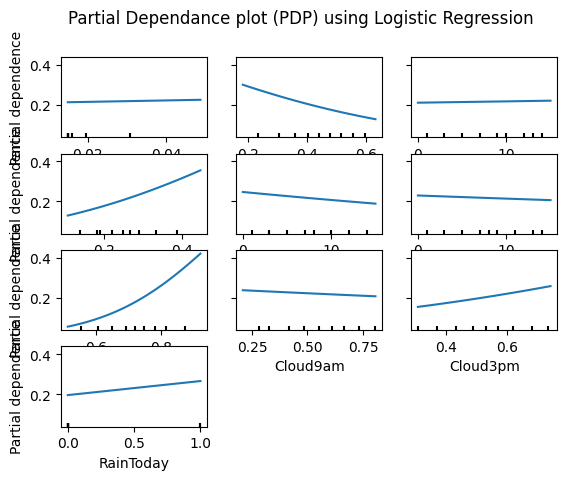

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(lr_model, X_test_kbest[Kbest], X_test[Kbest].columns)

fig = plt.gcf()
fig.suptitle("Partial Dependance plot (PDP) using Logistic Regression")
plt.rcParams["figure.figsize"] = (32, 24)
plt.show()

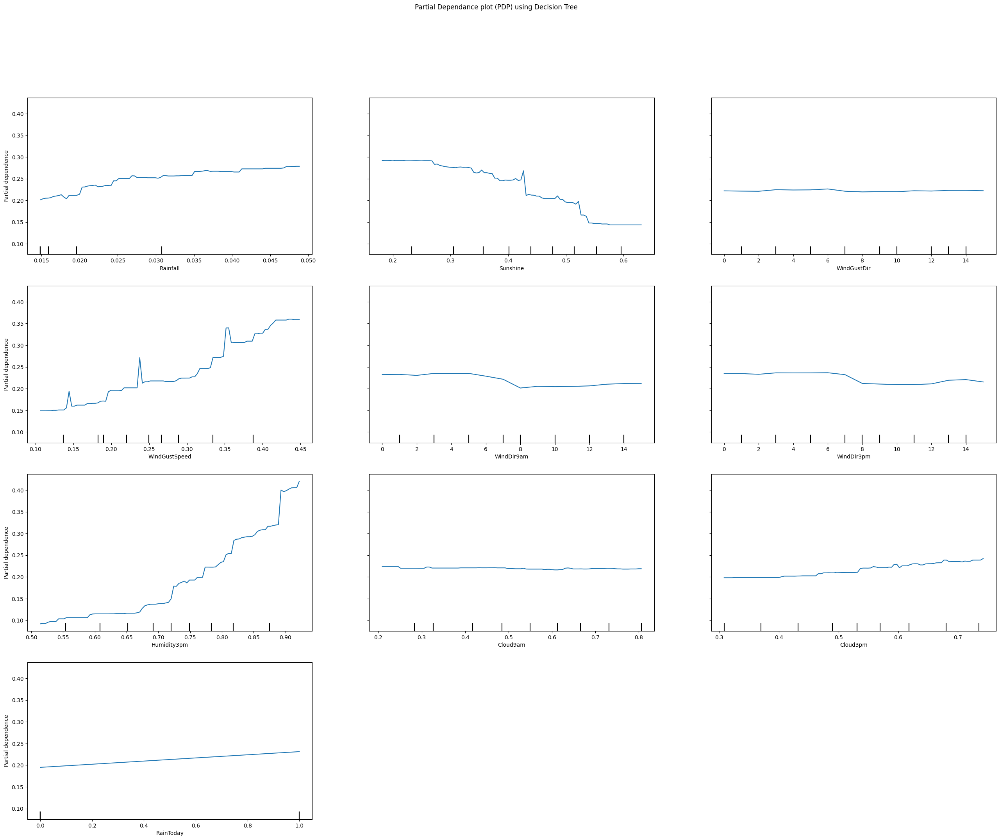

In [ ]:
PartialDependenceDisplay.from_estimator(dt_model, X_test_kbest[Kbest], X_test_kbest[Kbest].columns)
fig = plt.gcf()
fig.suptitle("Partial Dependance plot (PDP) using Decision Tree")
plt.rcParams["figure.figsize"] = (32, 24)
plt.show()

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


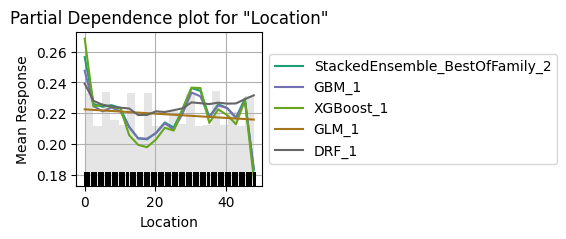

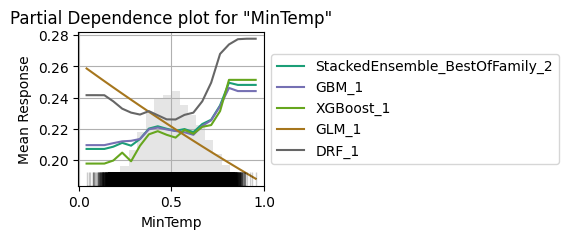

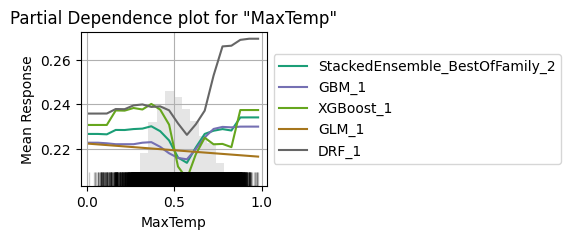

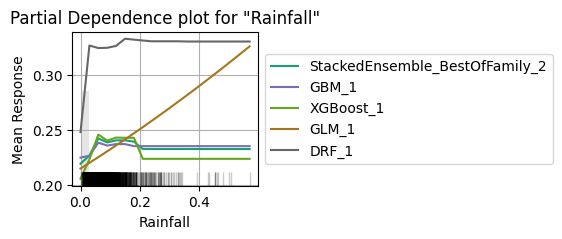

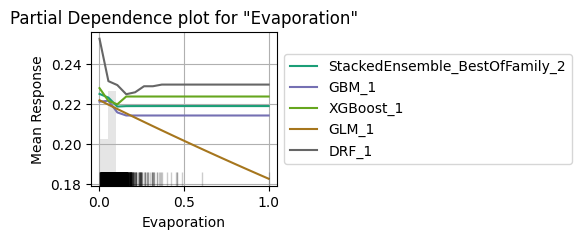

...

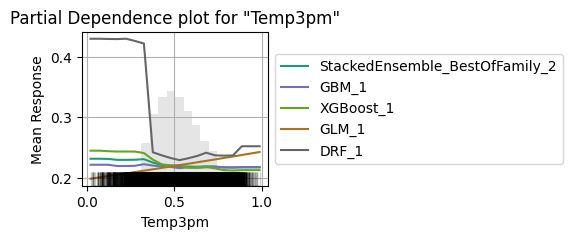

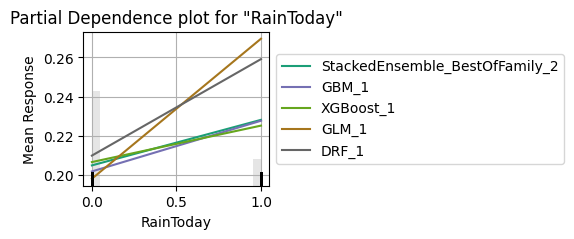

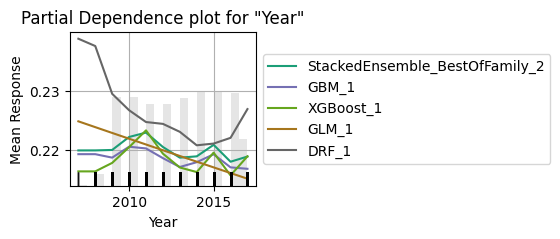

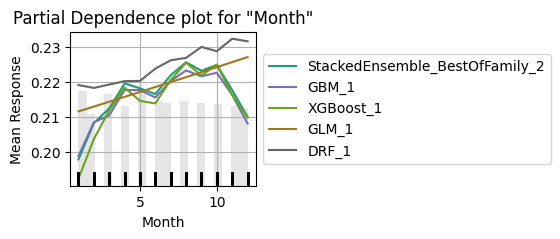

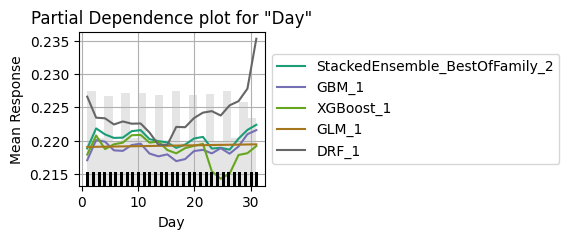

In [ ]:
explain_model = aml.explain(frame = h2o_data_test, figsize = (3,2),include_explanations=['pdp'] )

PDP plots show the variance of target variable on a predictor variable as per each model run in automl. 

## Individual conditional expectation (ICE) plot

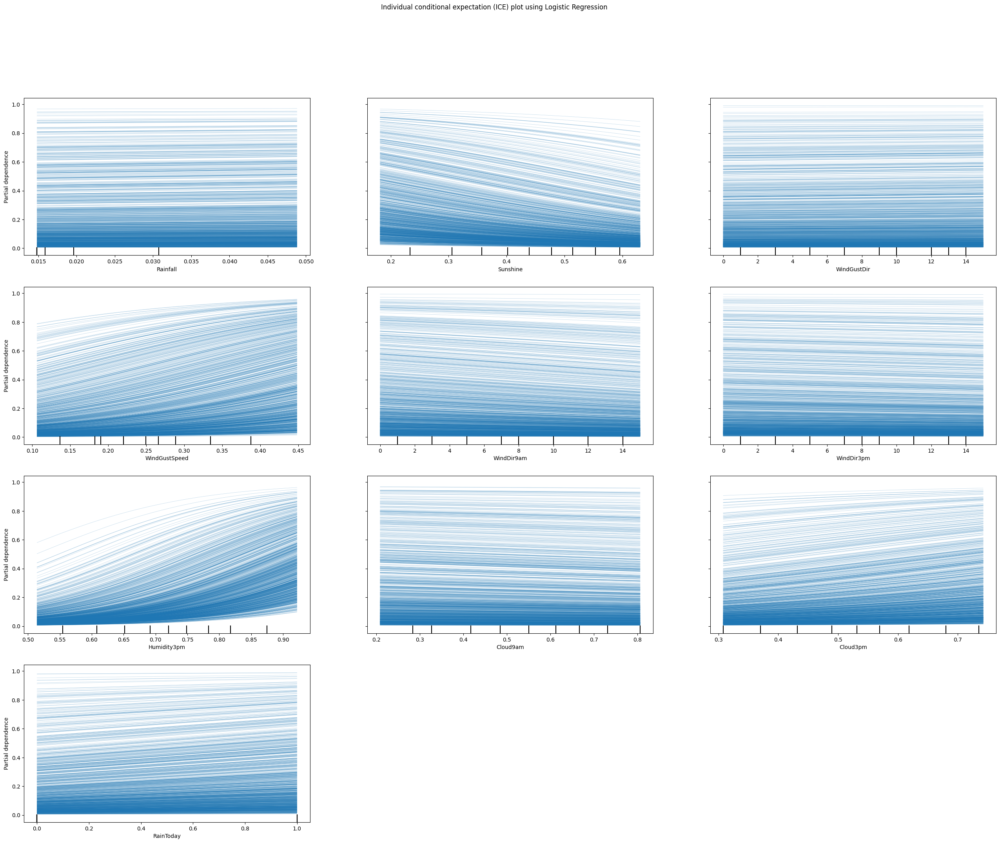

In [ ]:
PartialDependenceDisplay.from_estimator(lr_model, X_test_kbest[Kbest], X_test_kbest[Kbest].columns,kind='individual')

fig = plt.gcf()
fig.suptitle("Individual conditional expectation (ICE) plot using Logistic Regression")
plt.rcParams["figure.figsize"] = (32, 24)
plt.show()

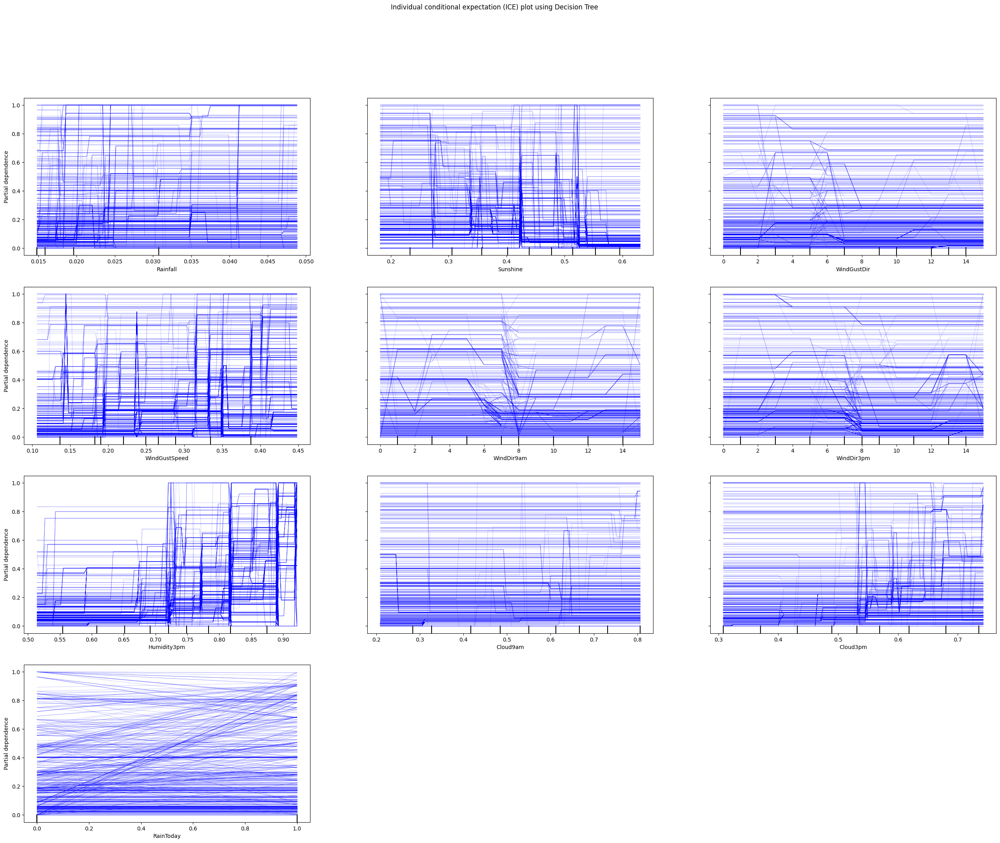

In [ ]:
PartialDependenceDisplay.from_estimator(dt_model, X_test_kbest[Kbest], X_test_kbest[Kbest].columns, kind='individual')

fig = plt.gcf()
fig.suptitle("Individual conditional expectation (ICE) plot using Decision Tree")
plt.rcParams["figure.figsize"] = (32, 24)
plt.show()


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


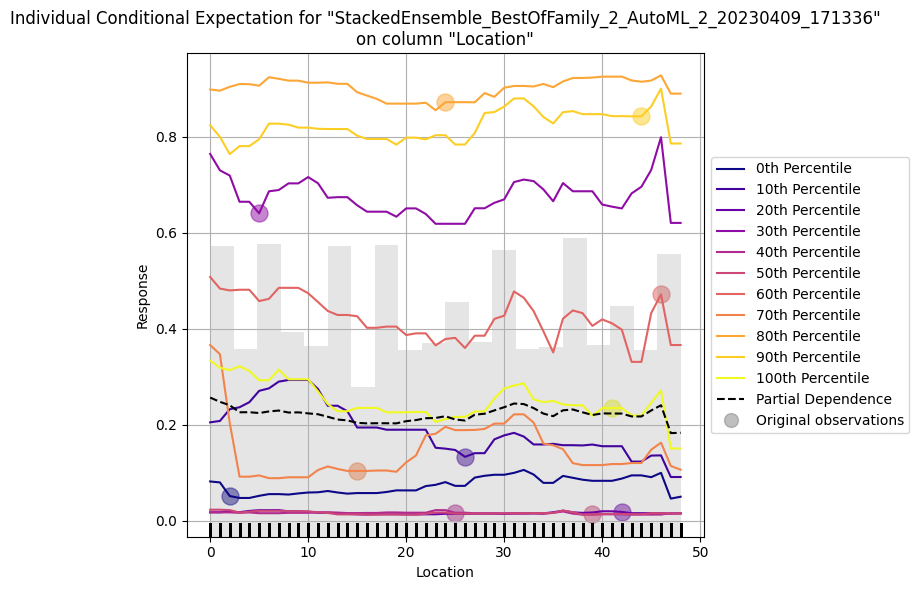

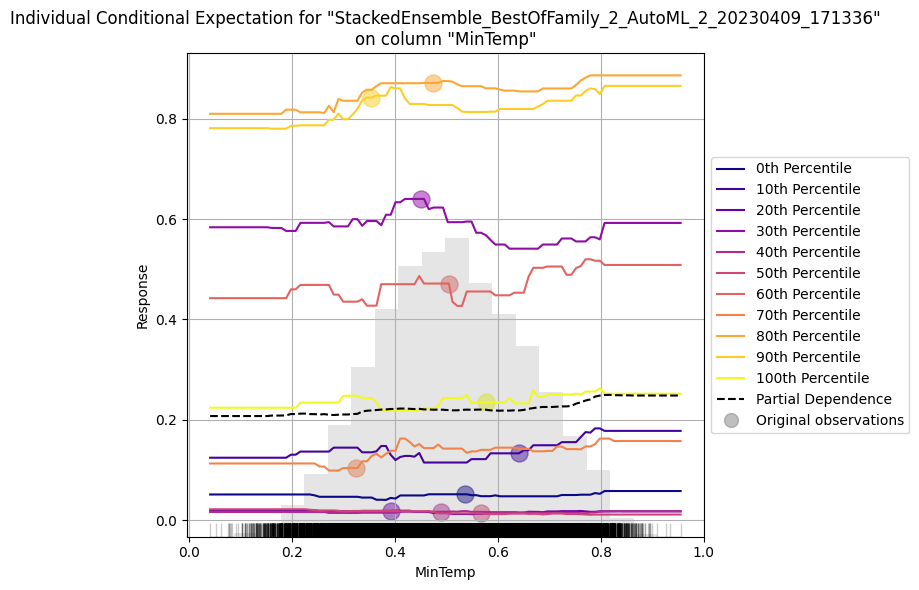

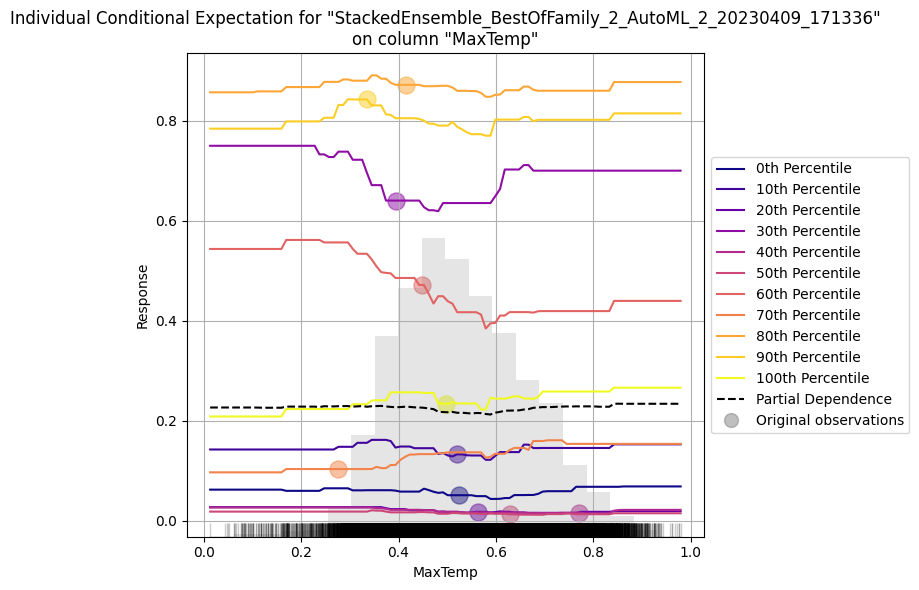

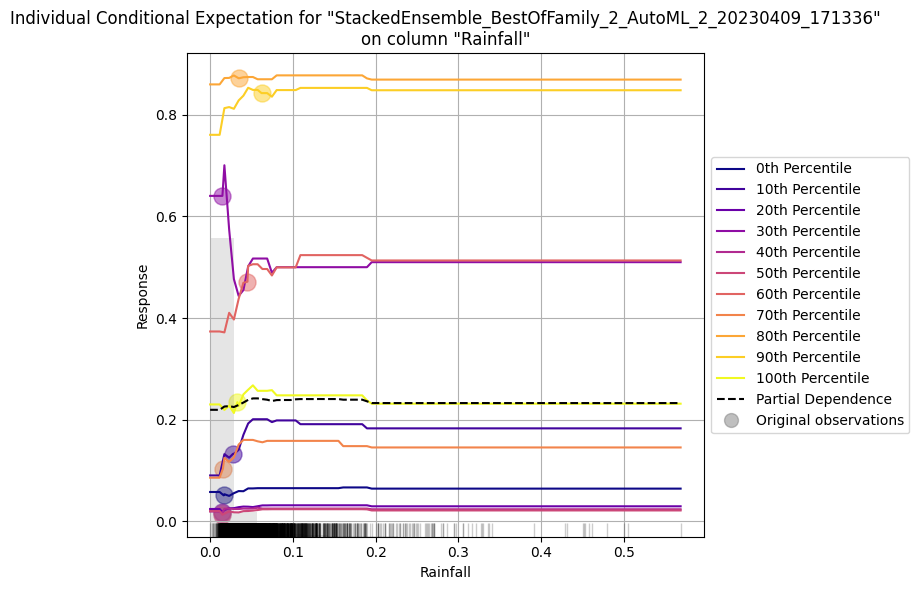

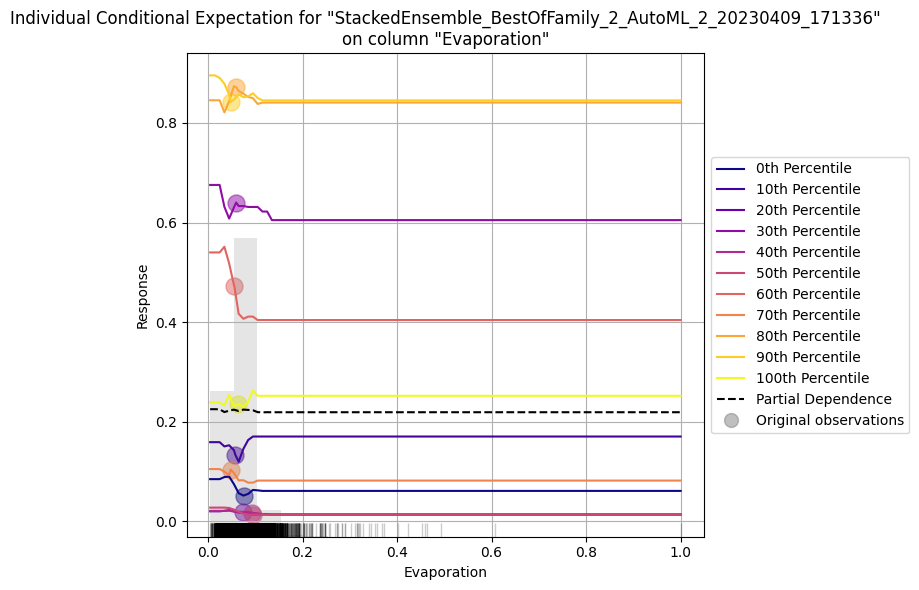

...

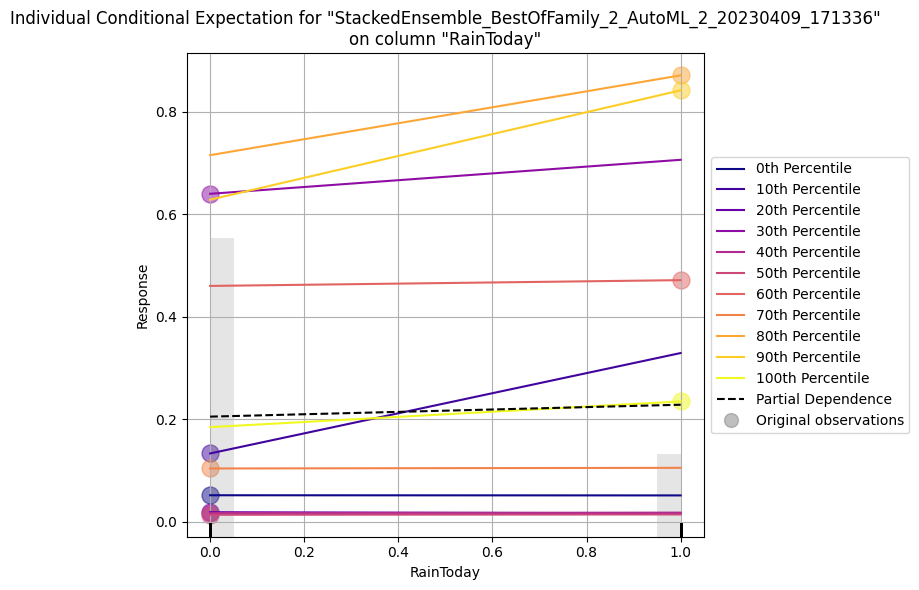

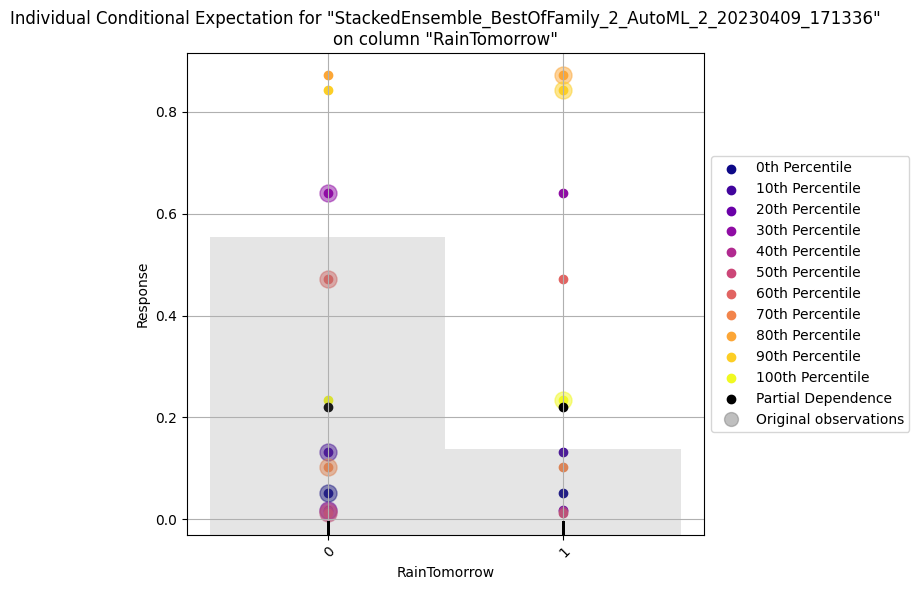

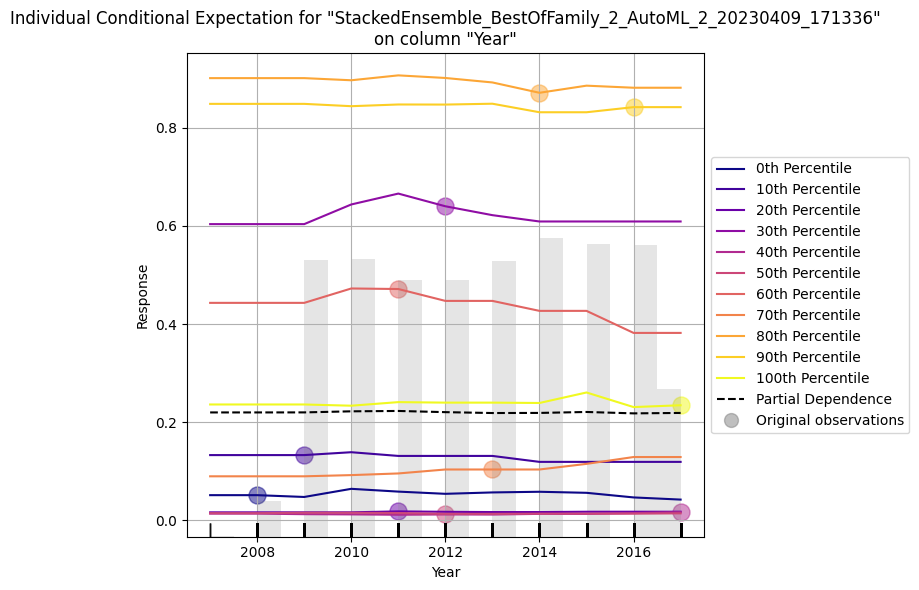

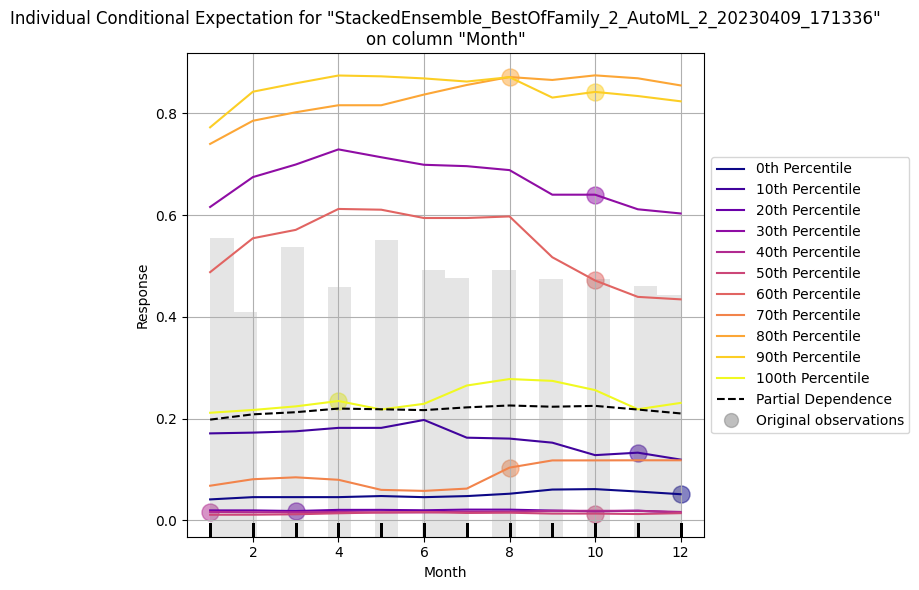

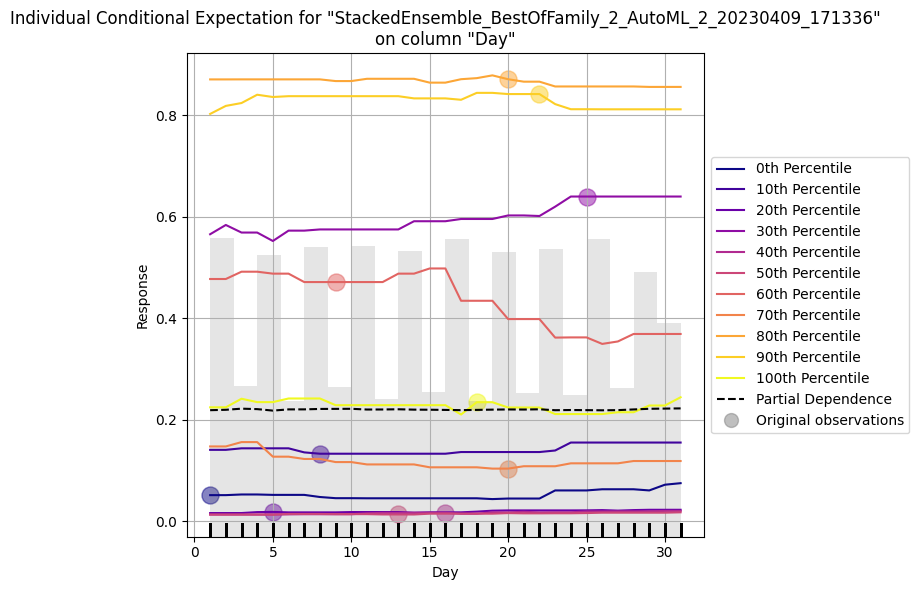

In [ ]:
model = aml.leader
for col in h2o_data_test.columns:
  plot = model.ice_plot(h2o_data_test, col, figsize = (8,6))

Similar to PDP, an individual conditional expectation (ICE) plot shows the dependence between the target function and an input feature of interest. However, unlike a PDP, which shows the average effect of the input feature, an ICE plot visualizes the dependence of the prediction on a feature for each sample separately with one line per sample. 



# Worked Example

Lets look at another example dataset for binary classifcation 

In [5]:
del df
#del data
#del scaled_data
#del normalized_data

In [9]:
!kaggle datasets download -d iabhishekofficial/mobile-price-classification
!unzip -o mobile-price-classification.zip -d /content

mobile-price-classification.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  mobile-price-classification.zip
  inflating: /content/test.csv       
  inflating: /content/train.csv      


In [135]:
data=pd .read_csv("/content/train.csv")


In [136]:
data.head()


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [137]:
data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [138]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [139]:
data.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [140]:
categorical_columns = data.select_dtypes(include=['object']).columns
data[categorical_columns]

""
0
1
2
3
4
...
1995
1996
1997
1998


In [198]:
categorical_columns = ['blue', 'dual_sim', 'fc', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range']

In [207]:
categorical_columns = data[categorical_columns].columns
categorical_columns

Index(['blue', 'dual_sim', 'fc', 'four_g', 'n_cores', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [210]:
numerical_columns = data.select_dtypes(include=['int','float','float64']).columns
data[numerical_columns].describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [213]:
numerical_columns = ['battery_power', 'clock_speed', 'dual_sim', 
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 
       'touch_screen']
numerical_columns = data[numerical_columns].columns

battery_power


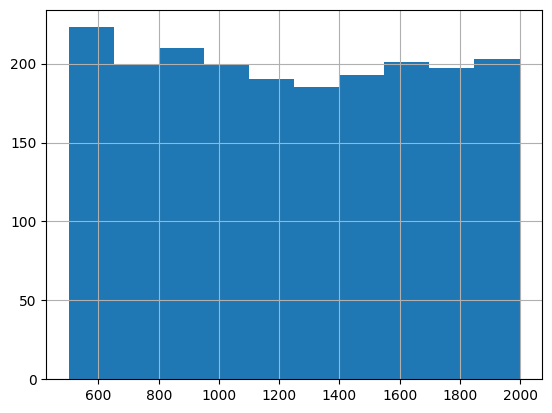

blue


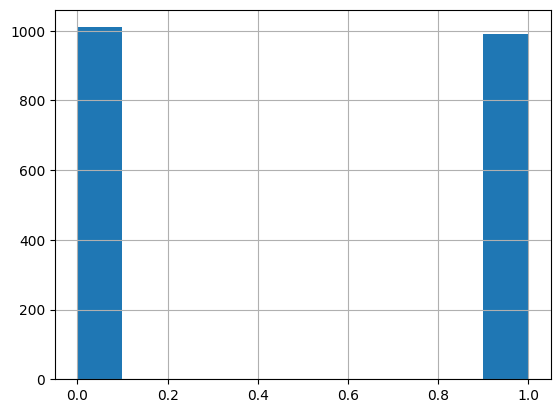

clock_speed


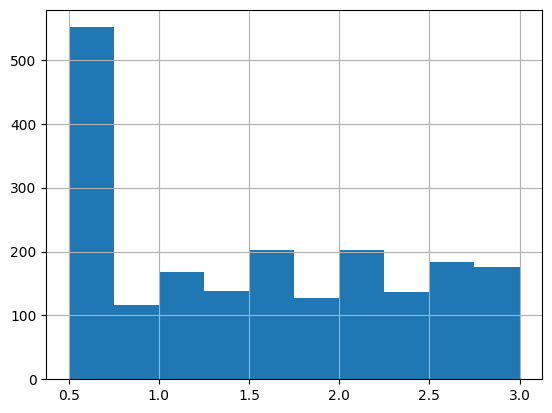

dual_sim


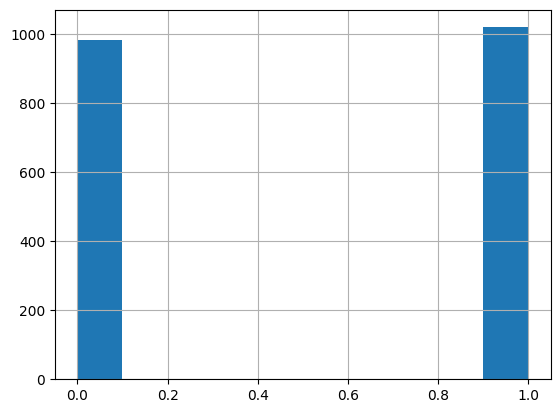

fc


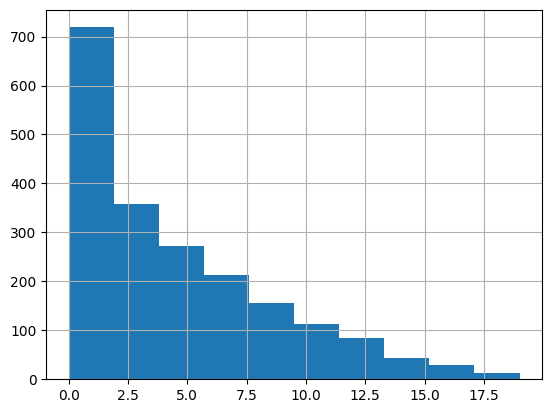

four_g


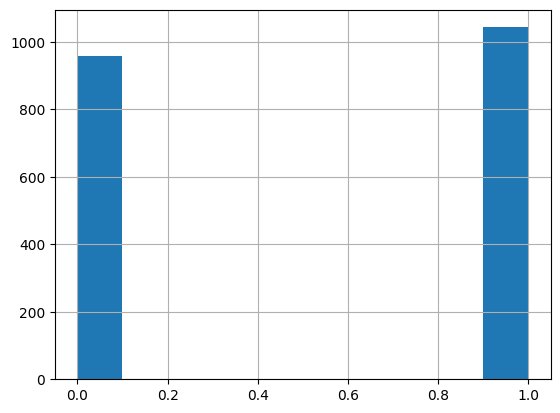

int_memory


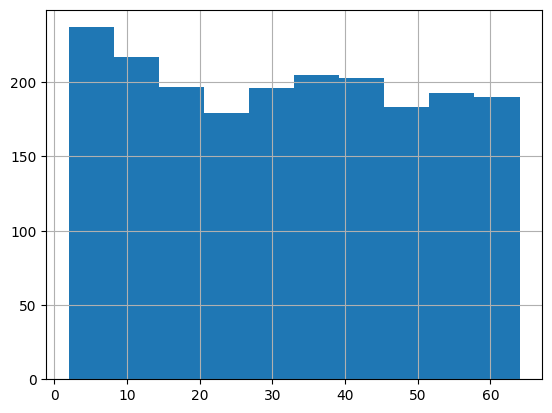

m_dep


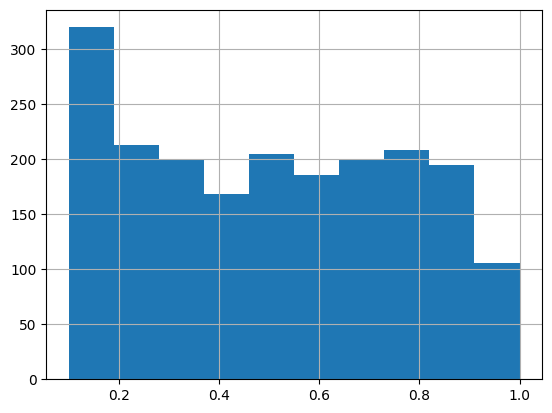

mobile_wt


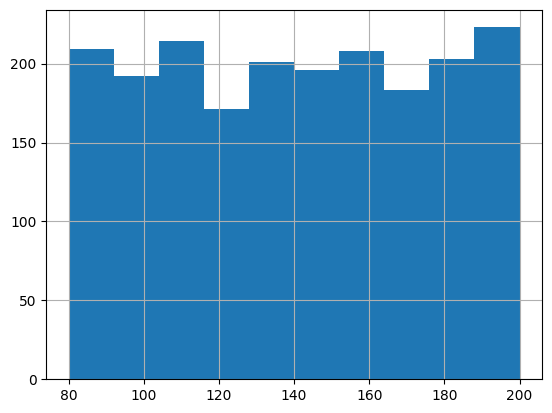

n_cores


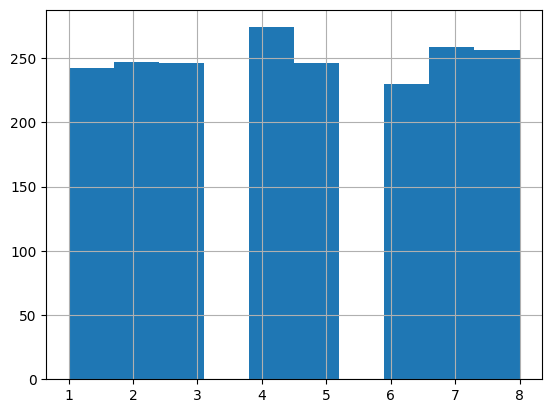

pc


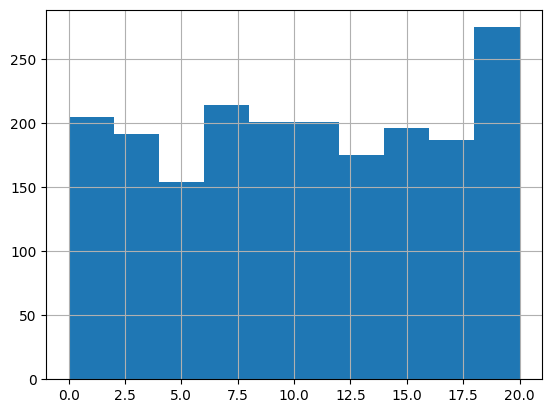

px_height


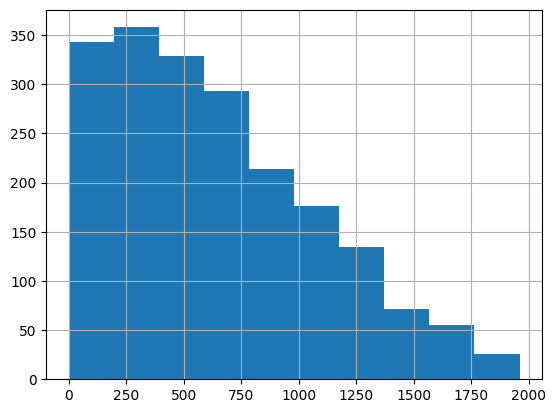

px_width


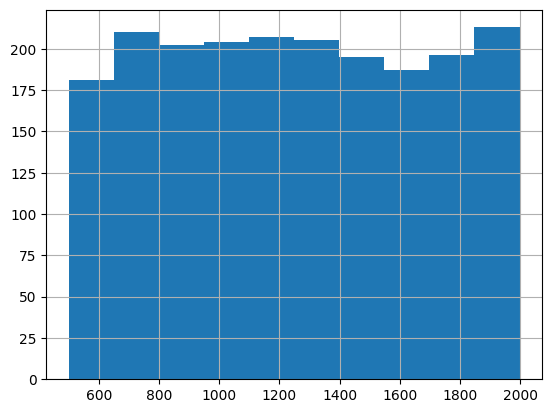

ram


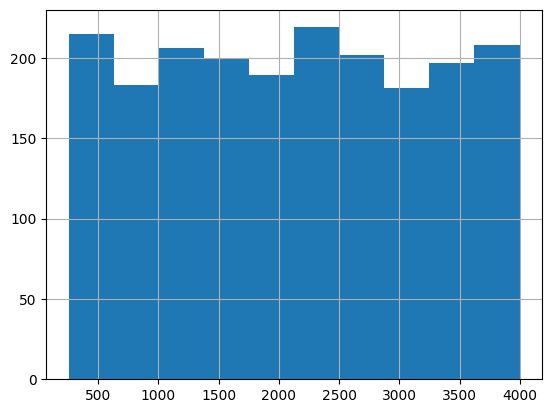

sc_h


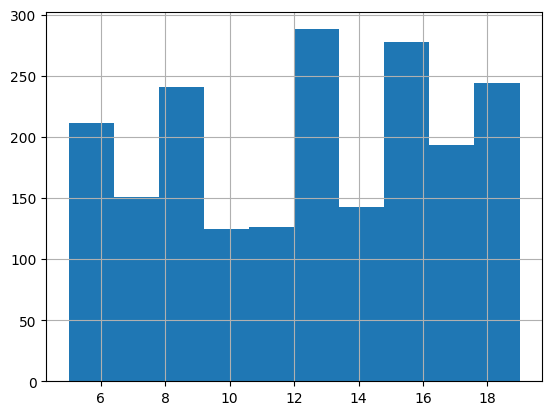

sc_w


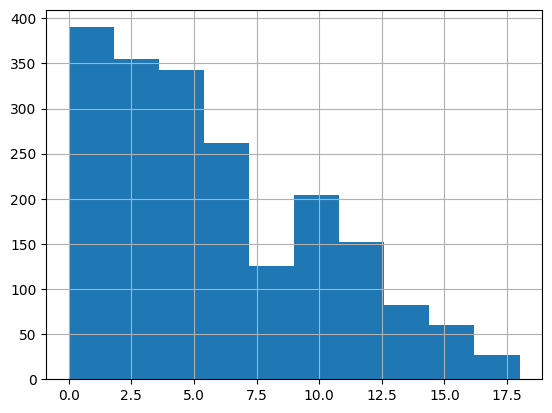

talk_time


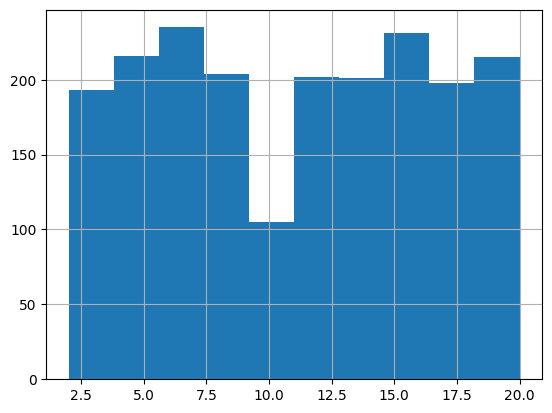

three_g


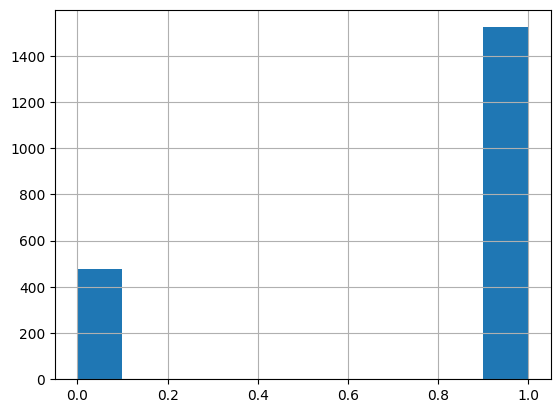

touch_screen


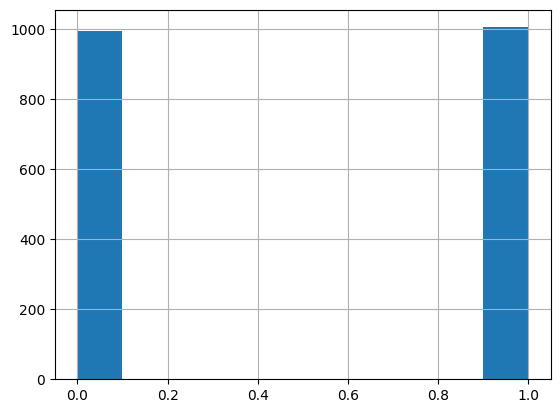

wifi


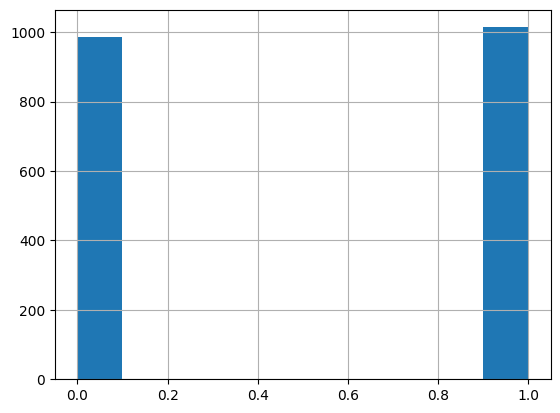

price_range


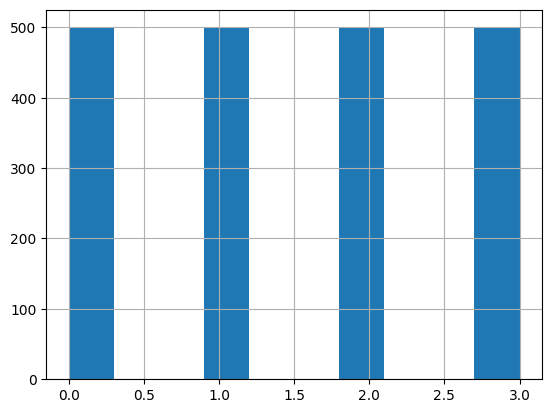

In [214]:
for i, column in enumerate(data):
    print(column)
    plt.figure(i)
    data[column].hist()
    plt.show()

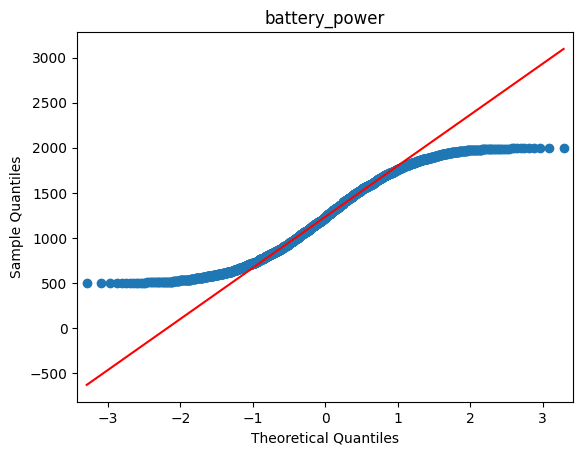

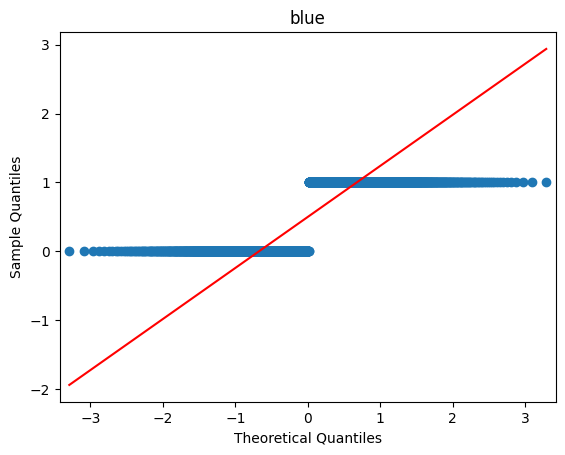

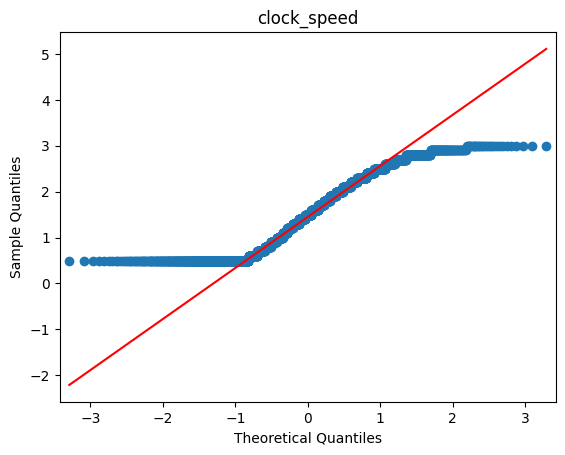

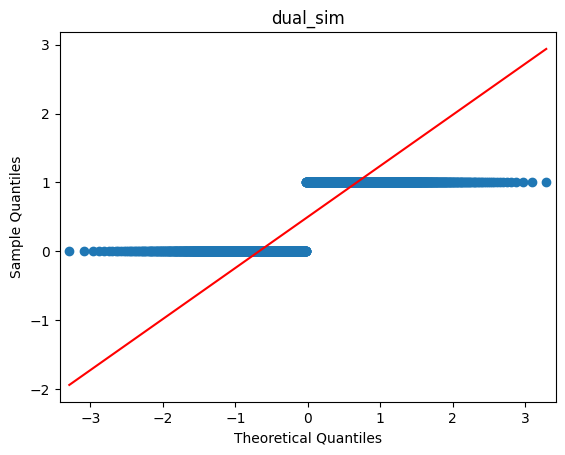

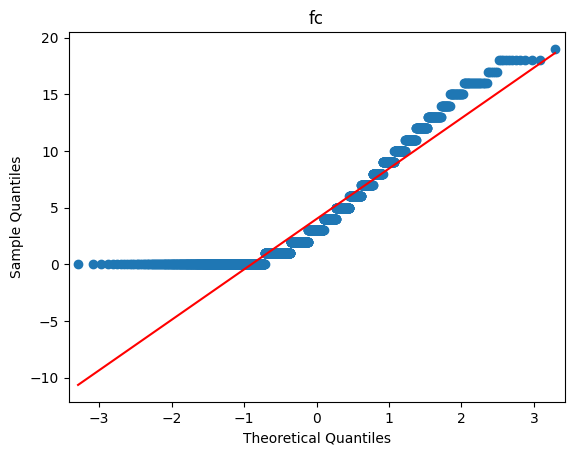

...

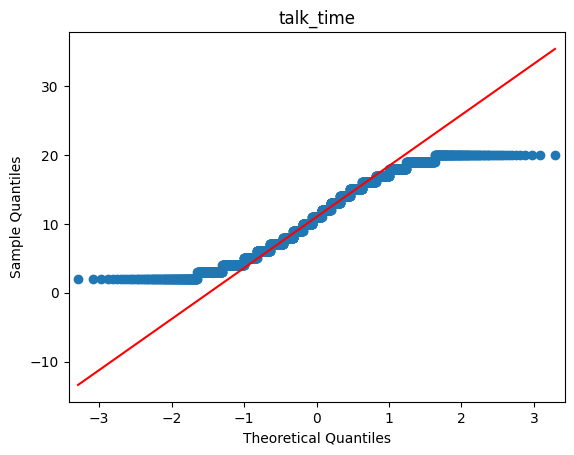

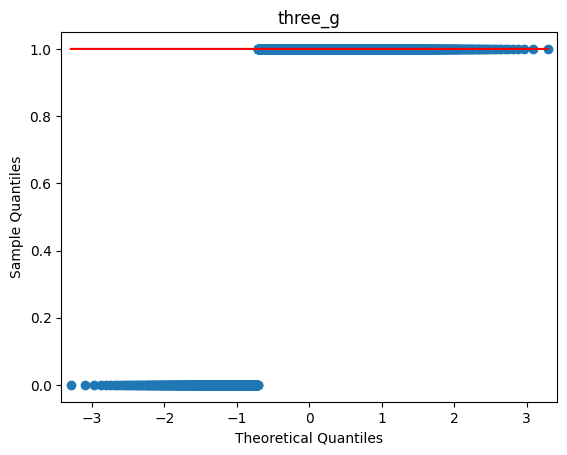

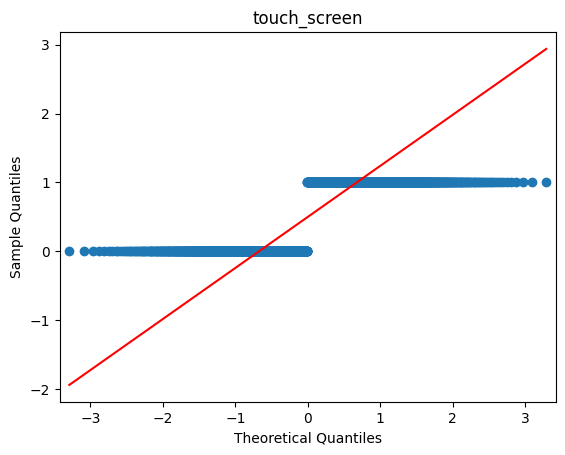

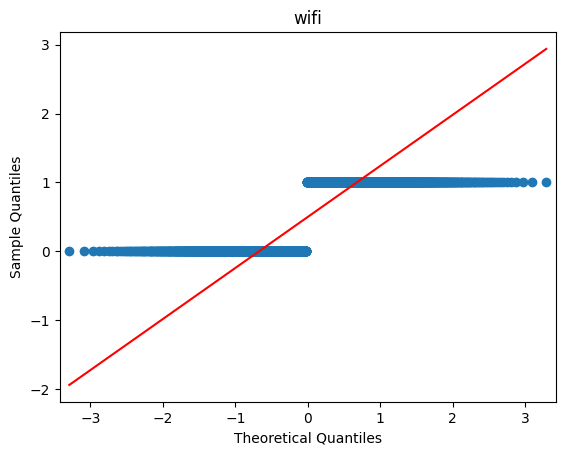

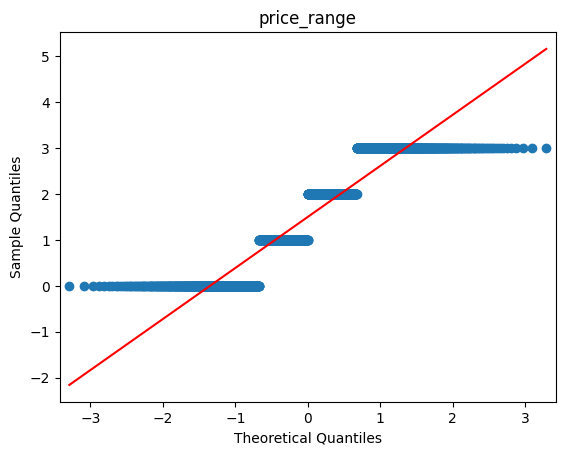

In [215]:
import statsmodels.api as sm
from scipy.stats import norm
import pylab

for column in data:
    sm.qqplot(data[column], line='q')
    pylab.title(column)
    pylab.show()

<Axes: >

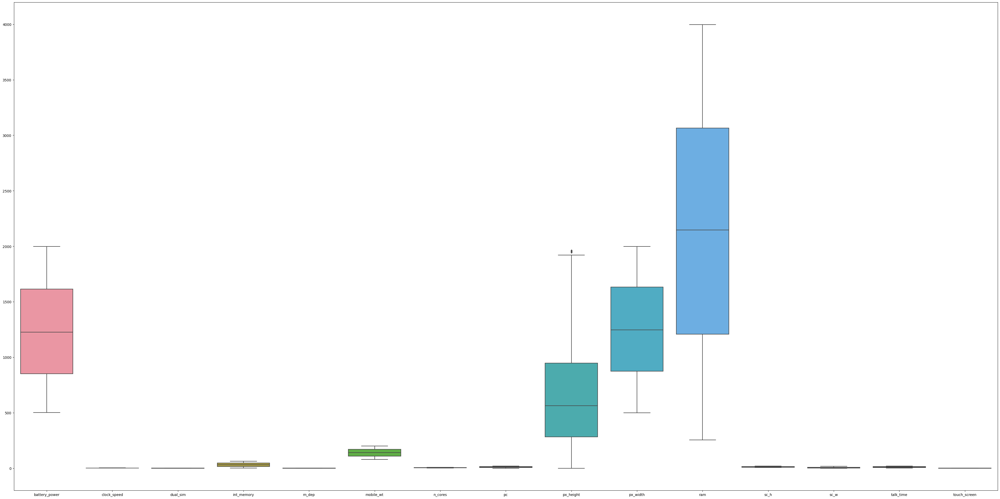

In [296]:
plt.figure(figsize=(50,25))
sns.boxplot(data=data[numerical_columns])

In [216]:
from sklearn import preprocessing

scaled_data = data.copy()

r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(scaled_data[numerical_columns])
scaled_data[numerical_columns] = pd.DataFrame(r_scaler.transform(scaled_data[numerical_columns]), index=scaled_data[numerical_columns].index, columns=scaled_data[numerical_columns].columns)


<Axes: >

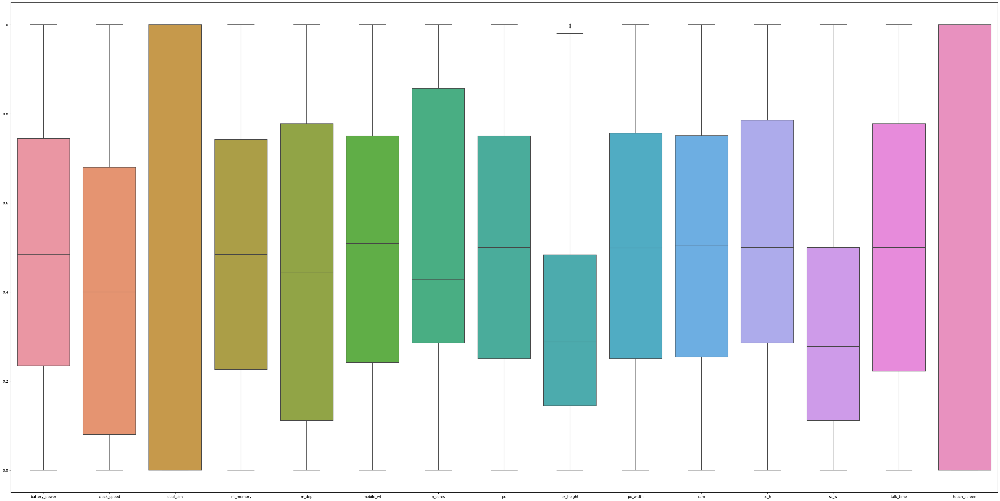

In [217]:
plt.figure(figsize=(50,25))
sns.boxplot(data=scaled_data[numerical_columns])

<Axes: >

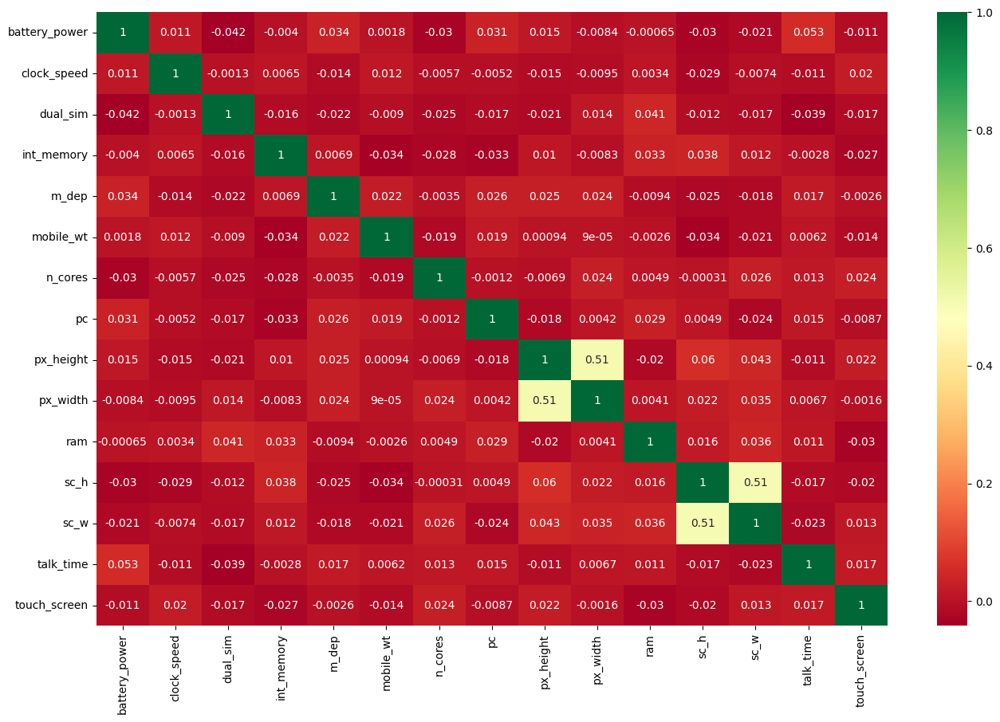

In [218]:
#the heat map of the correlation
plt.figure(figsize=(16,10))
sns.heatmap(scaled_data[numerical_columns].corr(), annot=True, cmap='RdYlGn')

In [243]:
X = scaled_data.drop("price_range",axis=1)
y = scaled_data["price_range"]

In [249]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [250]:
# train a logistic regression model on the training set
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


# instantiate the model
logreg = LogisticRegression(solver='liblinear', random_state=0)

# fit the model
lr_model  = logreg.fit(X_train, y_train)

In [251]:
y_pred_test = logreg.predict(X_test)
print(y_pred_test)

proba_0 = rfe.predict_proba(X_test)[:,0]
prob_1 = rfe.predict_proba(X_test)[:,1]

[3 0 2 1 3 0 0 3 3 1 0 3 0 2 3 0 3 2 2 0 0 0 3 0 1 2 3 2 3 1 1 0 1 0 2 3 0
 0 3 3 3 2 3 3 1 3 0 2 3 2 1 2 0 3 0 3 2 1 0 3 3 1 3 2 2 3 3 2 2 2 3 2 1 0
 1 3 2 2 2 1 3 3 3 0 0 0 2 1 1 3 1 2 3 0 0 3 3 3 0 3 2 2 2 1 3 1 3 3 2 3 3
 0 0 2 3 3 0 0 0 0 0 3 2 2 1 2 1 1 0 3 0 3 3 3 3 3 3 1 0 0 1 2 1 3 0 3 0 0
 2 0 1 1 2 1 3 0 0 3 1 3 2 1 3 2 2 3 3 3 2 0 3 2 2 3 3 0 2 2 3 1 2 2 0 2 2
 2 1 0 3 3 1 1 0 2 3 0 0 2 2 0 3 3 3 1 2 3 3 3 0 0 0 1 3 3 0 0 0 3 2 3 3 3
 0 0 3 3 3 2 0 2 0 0 0 3 3 0 1 2 0 1 0 2 3 3 0 0 1 3 3 1 3 0 3 1 0 0 2 3 3
 3 0 0 1 2 3 1 2 3 2 1 0 3 3 1 2 3 2 2 2 1 0 2 2 1 0 0 3 2 2 3 0 1 2 0 1 3
 3 0 2 0 0 1 3 0 0 2 3 1 1 0 1 0 3 0 3 3 2 3 0 1 3 0 1 2 0 1 0 3 1 0 3 0 0
 1 3 0 3 2 2 0 1 3 0 2 1 0 2 1 2 0 2 0 0 3 2 2 3 3 3 0 3 2 2 1 3 3 3 3 3 0
 2 0 3 0 0 1 2 3 1 3 1 1 0 1 2 3 0 0 1 3 0 3 0 2 3 1 1 0 3 0]


In [252]:
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Model accuracy score: 0.7875


In [265]:
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))
print()
print(lr_model.coef_)

Model accuracy score: 0.8125

[[-2.91297971e+00 -1.48298703e-02  3.72572824e-01  1.28111886e-01
  -1.24343121e-02  1.88961967e-03  8.86952855e-03 -3.72625731e-03
   4.00487698e-01  5.34939622e-01  2.05525426e-01 -2.06973460e+00
  -1.57616676e+00 -1.21690962e+01  3.07986048e-01  2.92495542e-01
   2.59207944e-02  5.11567948e-02  2.30564152e-01  1.71967315e-01]
 [-4.04087864e-02  6.71081934e-03 -6.95417233e-02  7.78682336e-02
   1.48314090e-03  7.56231252e-02  9.21337753e-02  2.14076566e-01
  -3.04930264e-02 -5.99929209e-01  1.53606343e-01  9.15393327e-02
  -9.62036652e-02 -1.90227326e+00  1.76834138e-02 -3.47059913e-01
   2.69948363e-01 -1.52935119e-02  5.50592727e-02  3.88318092e-02]
 [-7.35029112e-02 -8.80332985e-02 -1.44033076e-01 -1.45536400e-01
   1.82567017e-02 -2.34831185e-01 -2.78738225e-01 -8.72594136e-02
   4.75030057e-01  2.81915046e-01 -1.82599772e-01 -4.60934832e-02
  -1.13849096e-01  2.03904904e+00 -3.58465547e-01  1.26649208e-01
  -7.60362011e-02  1.17169832e-01 -1.8254497

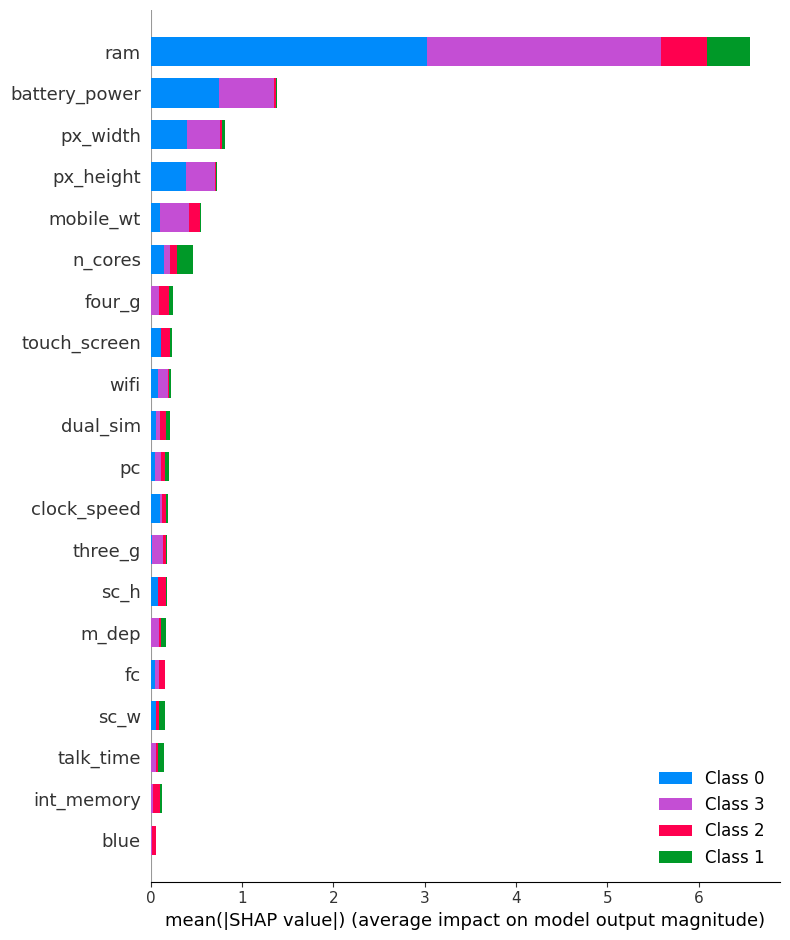

In [254]:
explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = explainer.shap_values(X_train)

shap.summary_plot(linear_shap_values, X_train, feature_names=X_train.columns)

In [255]:
clf = DecisionTreeClassifier(max_depth = 10, random_state = 42)
dt_model = clf.fit(X_train, y_train)
y_pred_test = clf.predict(X_test)
metrics.accuracy_score(y_test, y_pred_test)

0.8125

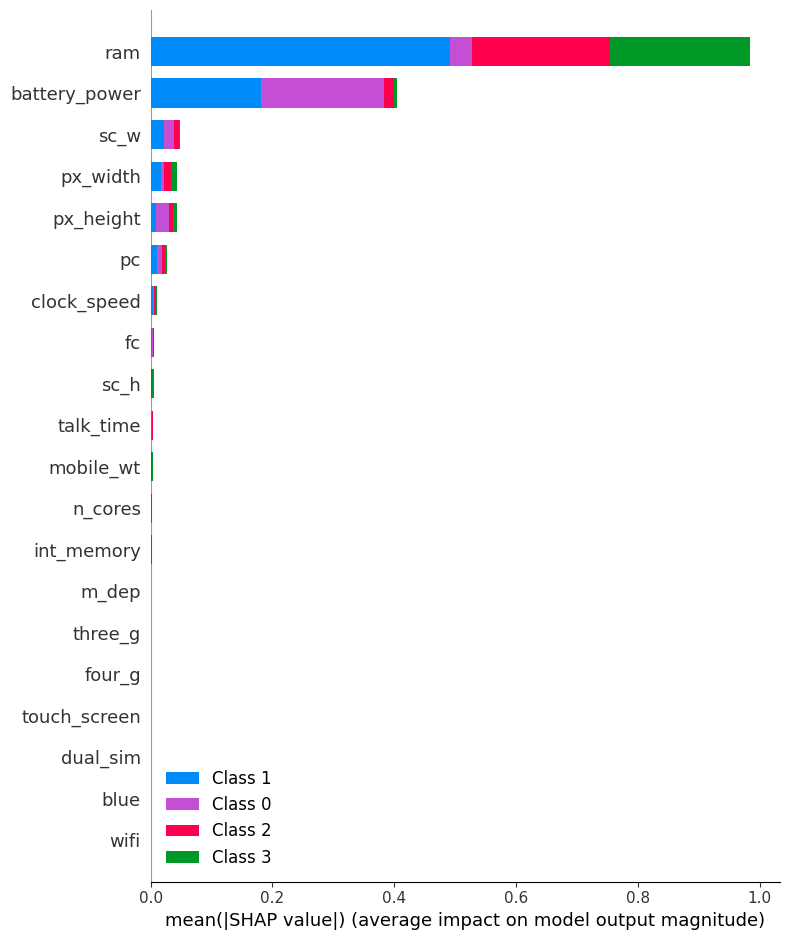

In [256]:
tree_shap_values = shap.TreeExplainer(clf.fit(X_train, y_train)).shap_values(X_train[:1])
shap.summary_plot(tree_shap_values, X_train, feature_names=X_train.columns)

## AutoML H2O

In [308]:
min_mem_size=6 
run_time=240
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))

port_no=random.randint(5555,55555)

In [309]:
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:30225..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpvg3saeyq
  JVM stdout: /tmp/tmpvg3saeyq/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpvg3saeyq/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:30225
Connecting to H2O server at http://127.0.0.1:30225 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_unknownUser_z6hl2e
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [310]:
h2o_data_train = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [311]:
#h2o_data_test = h2o_data_train = h2o.H2OFrame(scaled_data)

In [312]:
aml = H2OAutoML(sort_metric = 'AUC', max_runtime_secs=222)

In [313]:
#Display all columns in X
X=h2o_data_train.columns
y_cat ='price_range'
X.remove(y_cat) 
print(X)

['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']


In [314]:
aml.train(x=X,y=y_cat,training_frame=h2o_data_train) 

AutoML progress: |███████████████ (failed)

04:13:03.677: Empty leaderboard.
AutoML was not able to build any model within a max runtime constraint of 222 seconds, you may want to increase this value before retrying.



OSError: ignored

In [ ]:
explain_model = aml.explain(frame = h2o_data_test, figsize = (8,6),include_explanations=['leaderboard'])

# **Conclusion**  



**1. What is the question?**  
  \
The requirement is to predict the weather on the next date i.e. the target variable RainTomorrow. This is a classification problem, since the target has two classes as possible values "Yes" and "No". The data has various different climatic observations as independant variables in both numerical and categorical form which help us decide the risk of rain. Since these are climatic observations, many have high correlation like Humidity and Sunshine, missing values, and varying prediction significance towards to the target variable.  
  \
**2. What did you do?**  
  \
To handle missing values, I imputed the missing data using mode for categorical features and MICE for numerical features.  

Using Label Encoder I encoded data for categorical features and looked at each features distribution.  

Since the target variable was imbalanced, I resampled the "No" variable to make it balanced.  

Next, I scaled the data to look at the presence of outliers and however this only somewhat affects Logistic Regression and not Decision Tree Classifier or AutoML. 

Now, finally I looked at correlation among features, which was highly present among a lot of the features. To get rid of this, I looked for the top performing features with the help of KBest and RFE methods.

Next I tried different models like Logistic Regression, OLS, Decision tree, Ensemble method, and AutoML which gave a stacked ensemble model.  
  \

**3. How well did it work?**  
  \
Considering the p-value of different variables, we see that that a lot of the features have high significance and also high multicolinearity. We try to combat this using feature selection, selecting top 10 features, which increased the accuracy by 1%.  

Since both Logistic Regression and Decision Tree perform well but did not improve much even after feature selection, I looked at AutoML for a better performance and ran it 5 nfolds to get 89% accuracy. Increasing the number of nfolds helps increase accuracy, however for the purpose of limiting runtime, I have kept it at 5.  
  \
We looked at SHAP analysis and other methods of model interpretation, to see the top significant and features and the target variable variance with them which gave us the ability to modify our modeling.  

SHAP analysis was the most detailed in the information it provided like value of predictor variable, as well as its impact. LIME analysis also gave us a measure of impact however did not provide much information on the value of the predictor variable.  
Both handle multicolinearity, and represent impact in presence of other variables.  

Partial Dependance Plot and Individual Conditional Expecation Plots give us detailed variance of each feature as per target variable, however this relationship correct only if the predictors are independant of each other.  
  \
**4. What did you learn?**  
  \
* I tried out and understood the various step in Data Lifecylcle like Data Gatehering, Data Preprocessing, Feature Selection, Model Planning, Modeling and Interpretation and Communicating the results.
* Data Preprocessing is an important aspect, putting effort into majorly impacts the performance of the model.
* Hyperparameter tuning is also very important as it impacts model performance
* Model Interpretaion helps with understanding the working of the model and gaining insights into the modeling.

# **References**  
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb. 
* https://www.interpretable.ai/interpretability/what/#:~:text=What%20does%20it%20mean%20to,comprehend%20and%20trust%20the%20model.  
* https://dzone.com/articles/using-an-automl-h2o-model-to-predict-attrition-and.  
* https://scikit-learn.org/stable/modules/partial_dependence.html.  


### MIT License

Copyright (c) 2023 Shabina Singh and AISkunks

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.